In [ ]:
"""import kagglehub
from scipy.io import loadmat
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Download latest version
path = kagglehub.dataset_download("inancigdem/eeg-data-for-mental-attention-state-detection")

print("Path to dataset files:", path)

# Collect all file names
file_names = []
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        file_names.append(os.path.join(dirname, filename))"""

'import kagglehub\nfrom scipy.io import loadmat\nimport os\nimport matplotlib.pyplot as plt\nimport pandas as pd\nimport numpy as np\n\n# Download latest version\npath = kagglehub.dataset_download("inancigdem/eeg-data-for-mental-attention-state-detection")\n\nprint("Path to dataset files:", path)\n\n# Collect all file names\nfile_names = []\nfor dirname, _, filenames in os.walk(path):\n    for filename in filenames:\n        file_names.append(os.path.join(dirname, filename))'

# Load data

In [ ]:
from scipy.io import loadmat
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.signal import butter, filtfilt, iirnotch
import mne
from mne.preprocessing import ICA

In [ ]:
path = 'C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data'

# Collect all file names
file_names = []
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('.mat'):
            file_names.append(os.path.join(dirname, filename))
        
# Sắp xếp file theo số thứ tự (để đảm bảo đúng thứ tự subject)
file_names.sort(key=lambda x: int(x.split('eeg_record')[-1].split('.mat')[0]))

In [ ]:
sampFreq = 128
channel_names = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']

In [ ]:
# Hàm đọc dữ liệu 
def load_data(file_name):
    mat = loadmat(file_name)

    # Trích xuất dữ liệu từ đối tượng 'o'
    mdata = mat['o']
    sampFreq = int(mdata['sampFreq'][0][0][0][0])  # Tần số lấy mẫu
    data = mdata['data'][0, 0]  # Dữ liệu đầy đủ

    # Lấy tín hiệu từ các kênh 4–17
    eeg_data = data[:, 3:17]

    return data, eeg_data

In [ ]:
def load_eeg_data(file_names):
    all_data = []
    for file_name in file_names:
        # Lấy Trial ID từ tên file
        trial_id = int(file_name.split('eeg_record')[-1].split('.mat')[0])

        try:
            print(f"Đang xử lý file: {file_name}, Trial ID: {trial_id}")
            _, eeg_data = load_data(file_name)

            # Kiểm tra kích thước dữ liệu trả về
            if eeg_data is not None and eeg_data.size > 0:
                all_data.append((eeg_data))
            else:
                print(f"Dữ liệu EEG từ file {file_name} không hợp lệ hoặc rỗng.")
        except Exception as e:
            print(f"Lỗi khi xử lý file {file_name}: {e}")
    
    return all_data

In [ ]:
def get_data_5days(full_data):
    num_initial_days=2

    filtered_data_5days = []

    for i in range(5):  # 5 người
        # Số lượng file của mỗi người, người thứ 5 có 6 file, còn lại là 7 file
        num_files = 7 if i != 4 else 6

        # Lấy dữ liệu từ các ngày đo thực sự (bỏ qua 2 ngày đầu)
        real_measurement_files = full_data[i * 7 + num_initial_days: i * 7 + num_files]

        # Thêm dữ liệu vào danh sách kết quả
        filtered_data_5days.extend(real_measurement_files)

    return filtered_data_5days

In [ ]:
full_data = load_eeg_data(file_names)
reduce_data_5days = get_data_5days(full_data)

Đang xử lý file: C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record1.mat, Trial ID: 1
Đang xử lý file: C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record2.mat, Trial ID: 2
Đang xử lý file: C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record3.mat, Trial ID: 3
Đang xử lý file: C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record4.mat, Trial ID: 4
Đang xử lý file: C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record5.mat, Trial ID: 5
Đang xử lý file: C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-

# Filter data

In [ ]:
from scipy.signal import butter, filtfilt, iirnotch

# Hàm tạo bộ lọc thông cao và thông thấp
def bandpass_filter(data, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data, axis=0)

# Hàm tạo bộ lọc notch
def notch_filter(data, notch_freq, fs, quality_factor=30):
    nyquist = 0.5 * fs
    notch = notch_freq / nyquist
    b, a = iirnotch(notch, quality_factor)
    return filtfilt(b, a, data, axis=0)

In [ ]:
def filter_data(data_set):
    # Lọc thông cao và thông thấp và lọc notch cho từng file
    filtered_all_data = []
    for data_eeg in data_set:
        # Lọc thông cao và thông thấp cho dữ liệu của file hiện tại
        lowcut = 0.5  # Hz
        highcut = 30  # Hz
        filtered_data_bandpass = bandpass_filter(data_eeg, lowcut, highcut, sampFreq)

        # Lọc notch để loại bỏ nhiễu 50 Hz cho dữ liệu đã lọc thông
        notch_freq = 50  # Hz
        filtered_data_notch = notch_filter(filtered_data_bandpass, notch_freq, sampFreq)

        # Lưu dữ liệu đã lọc vào danh sách
        filtered_all_data.append(filtered_data_notch)
    
    return filtered_all_data

In [ ]:
filtered_full_data = filter_data(full_data)
filtered_reduce_data = get_data_5days(filtered_full_data)

* Visualize data

In [ ]:
def analyze_data(filtered_all_data, file_names, subject_map=None, num_files=2):
    # Phân tích dữ liệu
    if subject_map is not None:
        # Chỉ phân tích những file có trong subject_map
        valid_indices = sum(subject_map.values(), [])
        valid_indices = [x - 1 for x in valid_indices]
    else:
        # Phân tích tất cả các file
        valid_indices = list(range(len(file_names)))

    for i in valid_indices[:num_files]:  # Duyệt qua một số file để trực quan hóa
        data, eeg_data = load_data(file_names[i])

        # Vẽ dữ liệu đầy đủ từ file
        print('Dữ liệu đầy đủ từ file {}:'.format(file_names[i]), data.shape)
        plt.figure(figsize=(10, 4))
        plt.plot(data)
        plt.title(f'Dữ liệu đầy đủ từ File {i + 1}')
        plt.xlabel('Samples')
        plt.ylabel('EEG Signal Amplitude')
        plt.show()

        # Vẽ dữ liệu từ các kênh 4-17
        print('\nDữ liệu EEG từ các kênh 4-17:', eeg_data.shape)
        plt.figure(figsize=(10, 4))
        plt.plot(eeg_data[:1000, :])  # Giả sử vẽ 1000 mẫu đầu tiên
        plt.title('Data EEG (Channel 4-17) from 1000 data')
        plt.xlabel('Samples')
        plt.ylabel('EEG Signal Amplitude')
        plt.show()

        # Biểu diễn tín hiệu sau khi lọc của 1000 data đầu tiên
        filtered_data = filtered_all_data[i]  # Lấy dữ liệu đã lọc của file thứ i
        plt.figure(figsize=(10, 4))
        plt.plot(filtered_data[:1000, :])  # Lấy 1000 mẫu đầu tiên từ dữ liệu đã lọc
        plt.title('EEG Data After Filtering (High-pass, Low-pass, Notch) from 1000 data')
        plt.xlabel('Sample Index')
        plt.ylabel('Amplitude')
        plt.show()

Dữ liệu đầy đủ từ file C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record1.mat: (308868, 25)


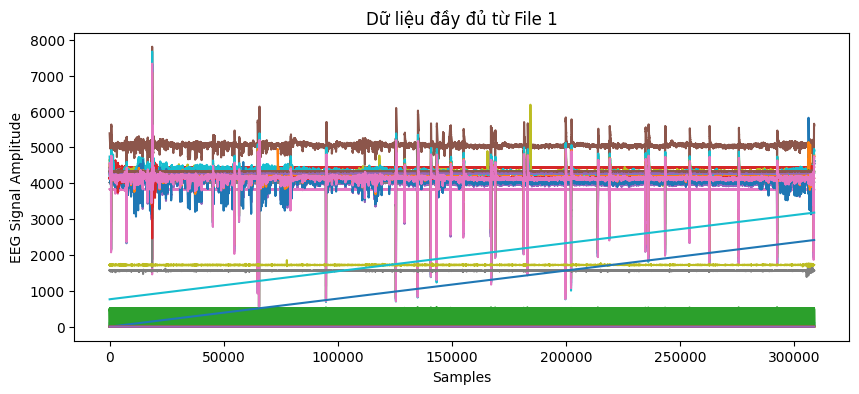


Dữ liệu EEG từ các kênh 4-17: (308868, 14)


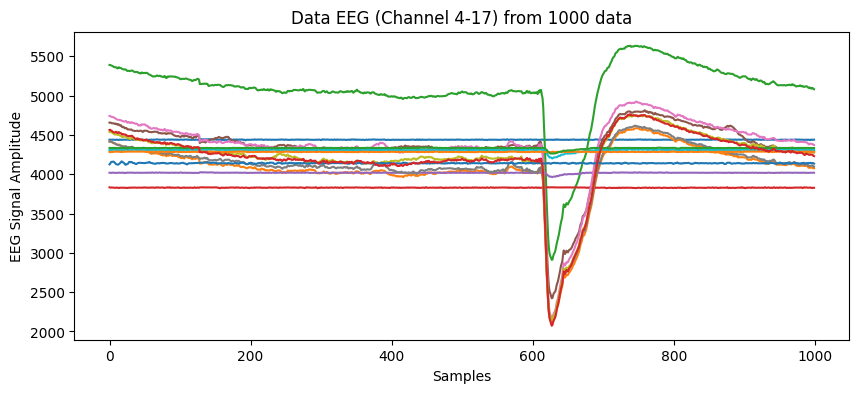

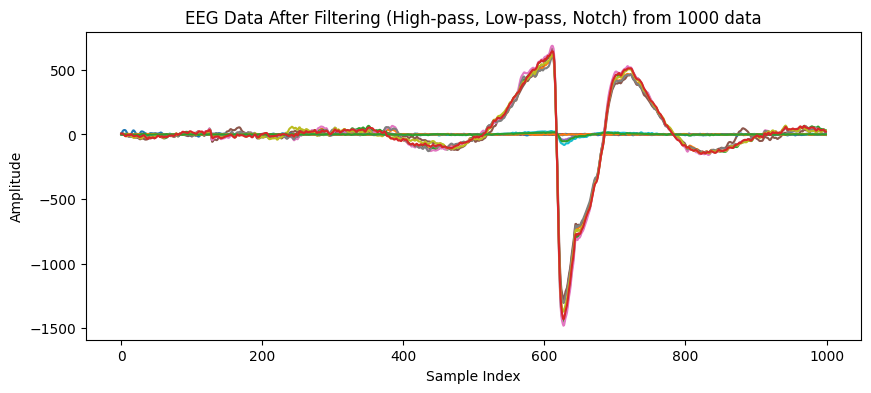

Dữ liệu đầy đủ từ file C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record2.mat: (366020, 25)


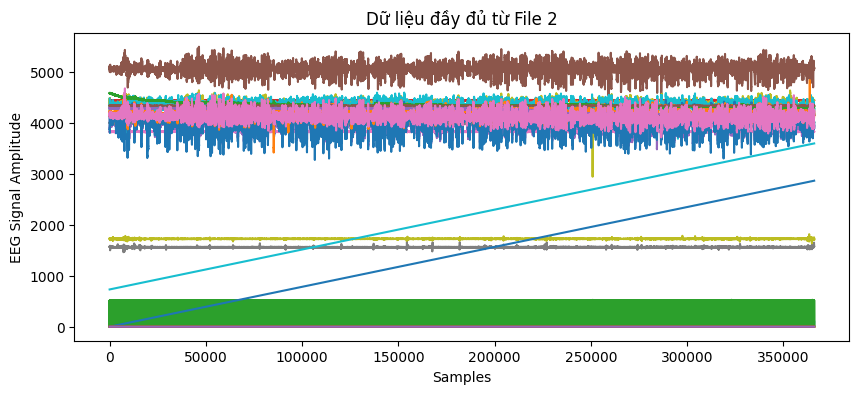


Dữ liệu EEG từ các kênh 4-17: (366020, 14)


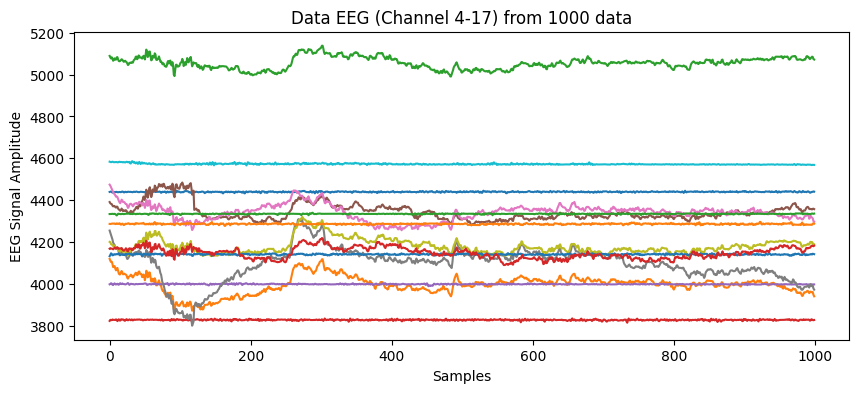

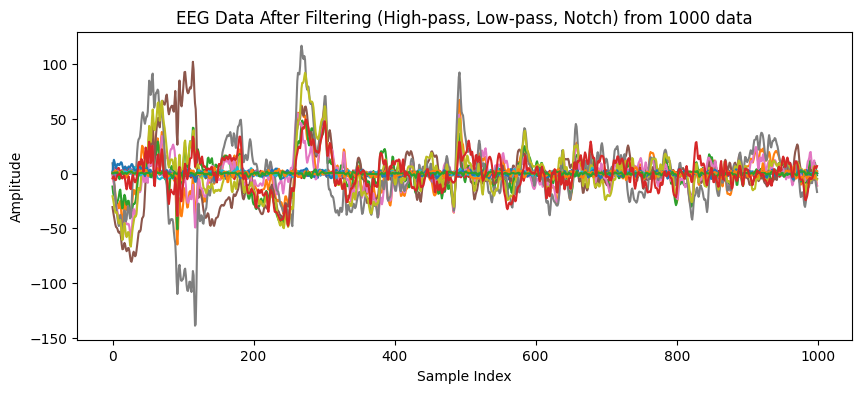

In [ ]:
analyze_data(filtered_full_data, file_names)

In [ ]:
# Số tổng subject (5)
total_subjects = 5

# Tạo ánh xạ subject_map, với việc lùi chỉ số
subject_map = {}
for s in range(1, total_subjects + 1):
    # Lùi chỉ số 2 ngày đầu, vì cần bỏ qua 2 ngày thử nghiệm
    a = int(7 * (s - 1)) + 3  # Bắt đầu từ ngày thứ 3
    if s != 5:
        b = a + 5  # Người 1-4 có 5 ngày thực tế
    else:
        b = a + 4  # Người 5 có 4 ngày thực tế
    subject_map[s] = [i for i in range(a, b)]

# In ra subject_map để kiểm tra
print(subject_map)

{1: [3, 4, 5, 6, 7], 2: [10, 11, 12, 13, 14], 3: [17, 18, 19, 20, 21], 4: [24, 25, 26, 27, 28], 5: [31, 32, 33, 34]}


Dữ liệu đầy đủ từ file C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record3.mat: (357224, 25)


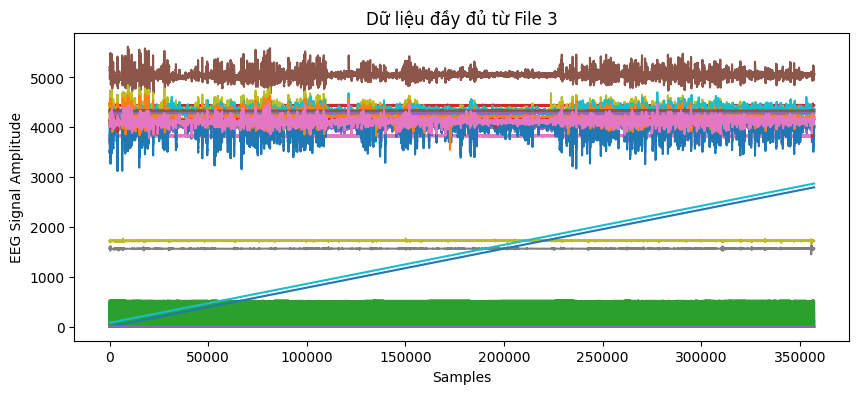


Dữ liệu EEG từ các kênh 4-17: (357224, 14)


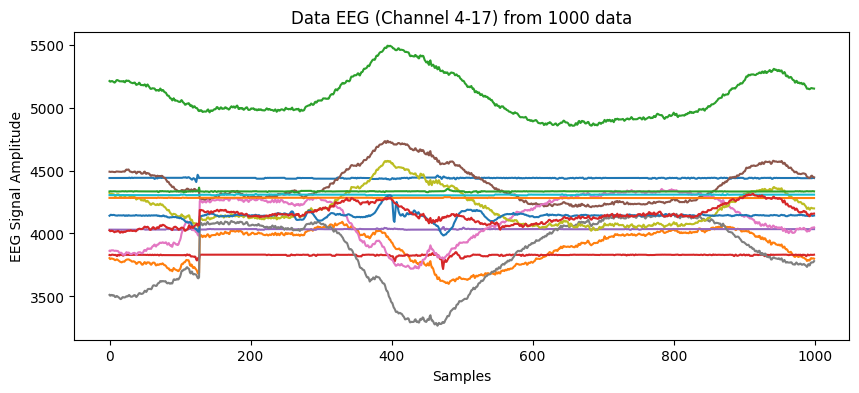

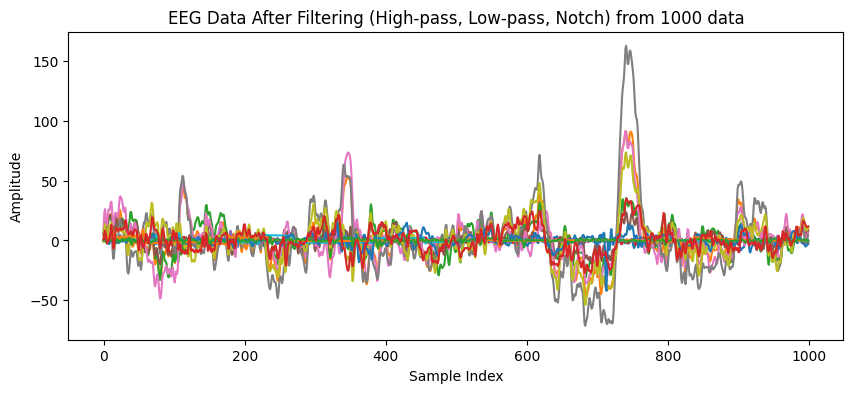

Dữ liệu đầy đủ từ file C:/Users/Administra/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/EEG Data\eeg_record4.mat: (380344, 25)


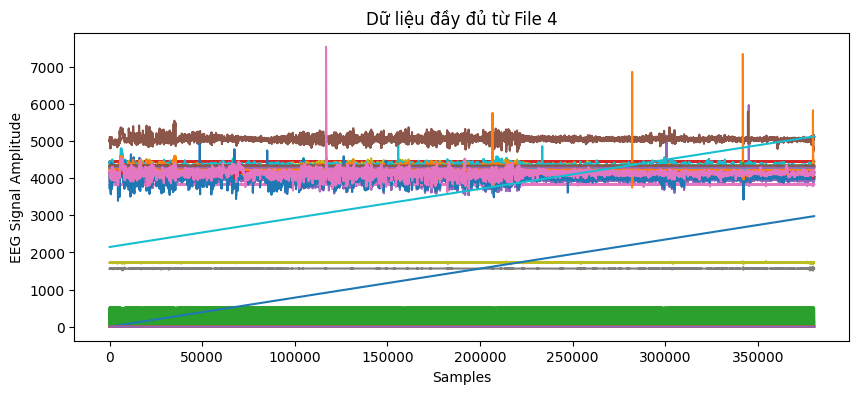


Dữ liệu EEG từ các kênh 4-17: (380344, 14)


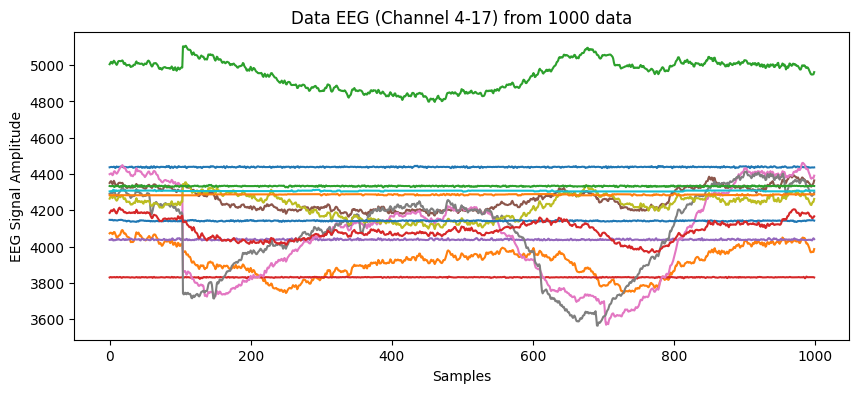

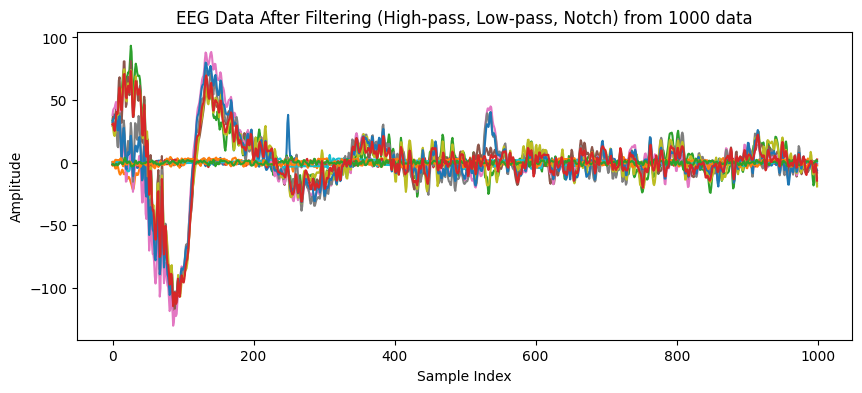

In [ ]:
analyze_data(filtered_reduce_data, file_names, subject_map=subject_map)

In [ ]:
def plot_frequency_bands(filtered_data):
    # Định nghĩa các dải tần số
    alpha_low, alpha_high = 8, 13  # Hz
    beta_low, beta_high = 13, 30  # Hz
    delta_low, delta_high = 0.5, 4  # Hz
    theta_low, theta_high = 4, 8  # Hz

    # Lọc thông dải để giữ lại các dải tần số khác nhau
    alpha_band = bandpass_filter(filtered_data, alpha_low, alpha_high, sampFreq)
    beta_band = bandpass_filter(filtered_data, beta_low, beta_high, sampFreq)
    delta_band = bandpass_filter(filtered_data, delta_low, delta_high, sampFreq)
    theta_band = bandpass_filter(filtered_data, theta_low, theta_high, sampFreq)

    # Biểu diễn tín hiệu dải delta
    plt.figure(figsize=(15, 6))
    plt.plot(delta_band[:1000])  # Chỉ hiển thị 1000 mẫu đầu tiên để dễ quan sát
    plt.title('EEG Delta Band (0.5-4 Hz)')
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.legend(channel_names, loc='upper right')
    plt.tight_layout()
    plt.show()

    # Biểu diễn tín hiệu dải theta
    plt.figure(figsize=(15, 6))
    plt.plot(theta_band[:1000])  # Chỉ hiển thị 1000 mẫu đầu tiên để dễ quan sát
    plt.title('EEG Theta Band (4-8 Hz)')
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.legend(channel_names, loc='upper right')
    plt.tight_layout()
    plt.show()

    # Biểu diễn tín hiệu dải alpha
    plt.figure(figsize=(15, 6))
    plt.plot(alpha_band[:1000])  # Chỉ hiển thị 1000 mẫu đầu tiên để dễ quan sát
    plt.title('EEG Alpha Band (8-13 Hz)')
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.legend(channel_names, loc='upper right')
    plt.tight_layout()
    plt.show()

    # Biểu diễn tín hiệu dải beta
    plt.figure(figsize=(15, 6))
    plt.plot(beta_band[:1000])  # Chỉ hiển thị 1000 mẫu đầu tiên để dễ quan sát
    plt.title('EEG Beta Band (13-30 Hz)')
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.legend(channel_names, loc='upper right')
    plt.tight_layout()
    plt.show()


In [ ]:
filtered_full_data[0].shape

(308868, 14)

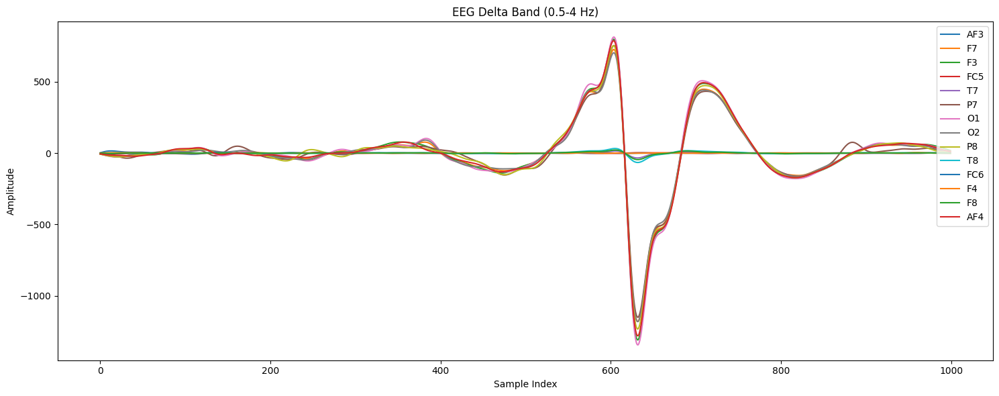

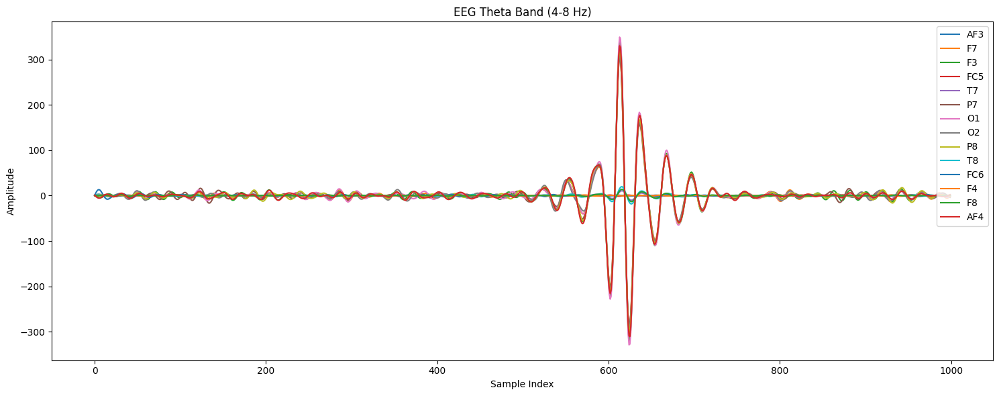

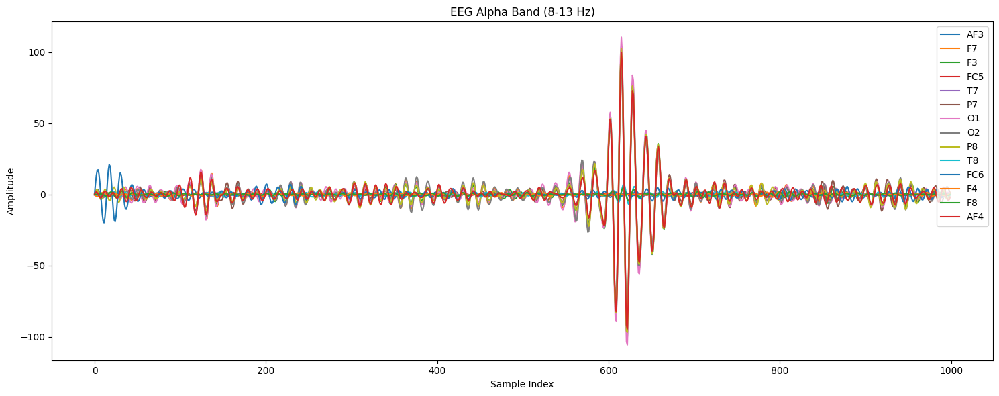

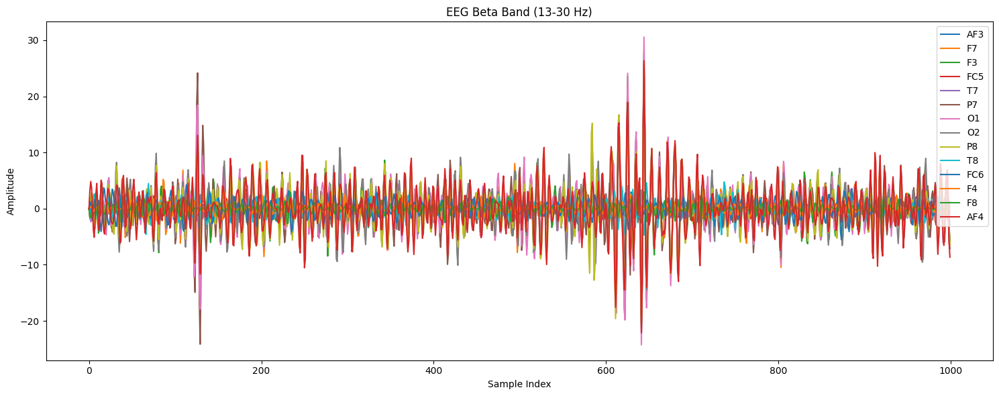

In [ ]:
plot_frequency_bands(filtered_full_data[0])

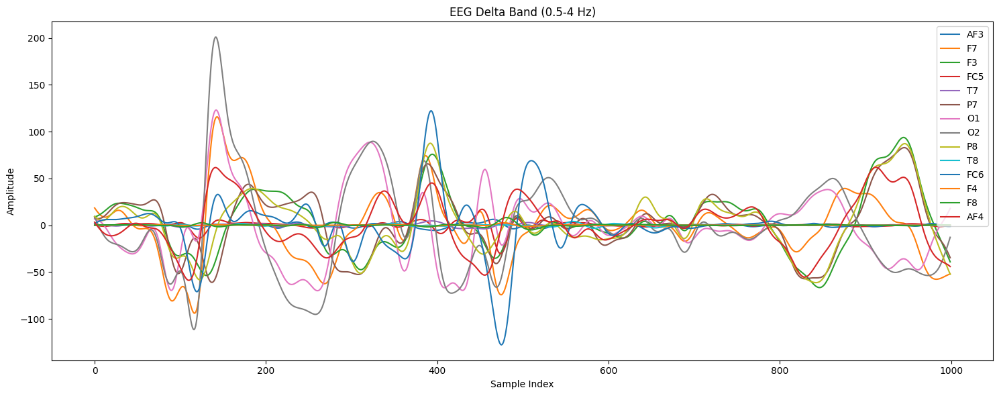

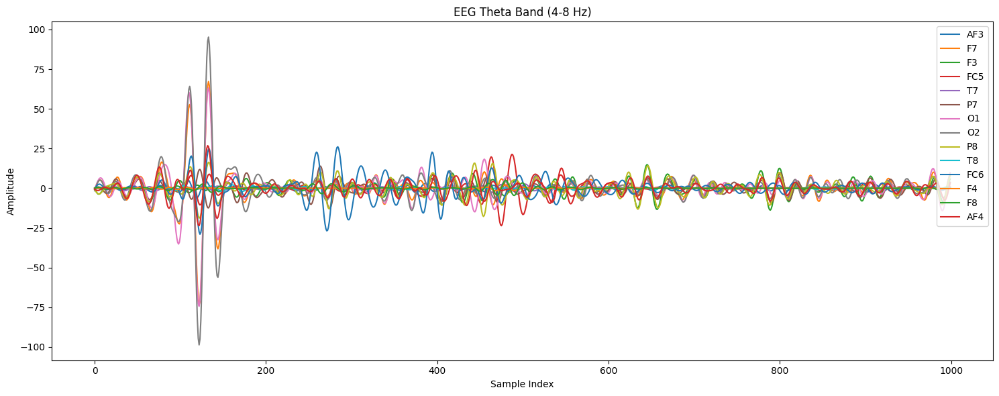

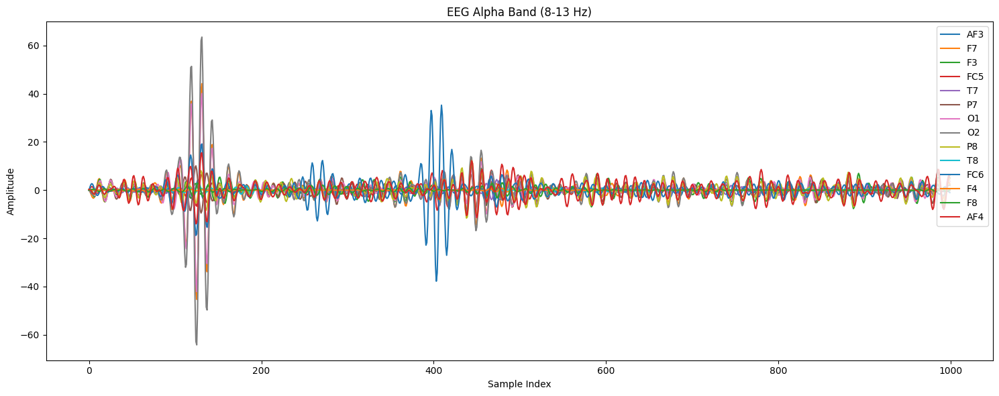

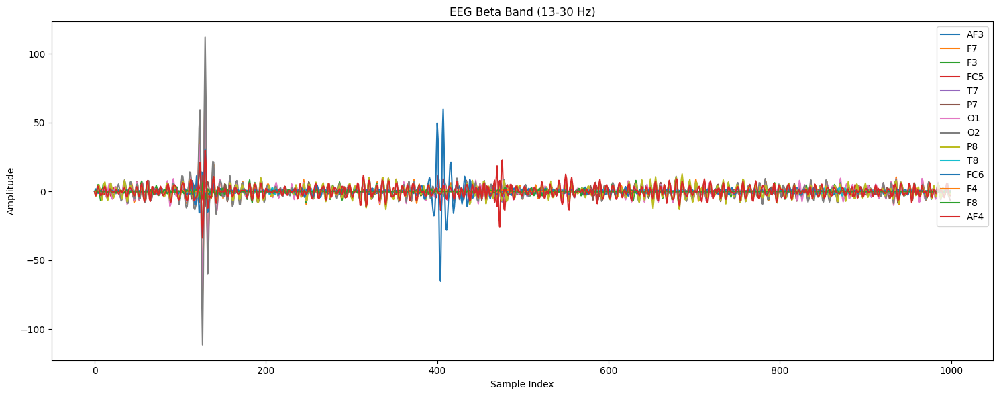

In [ ]:
plot_frequency_bands(filtered_reduce_data[0])

# ICA

In [ ]:
import mne
from mne.preprocessing import ICA

def apply_ica_to_data(filtered_data):
    ica_list = []
    raw_list = []

    for i in range(len(filtered_data)):

        data_one_day = filtered_data[i]

        # Tạo thông tin cho đối tượng Raw
        sfreq = 128  # Tần số lấy mẫu (giả sử là 128 Hz, bạn có thể thay đổi nếu khác)
        info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types='eeg')

        # Lấy dữ liệu đã lọc từ danh sách, chuyển đổi thành dạng phù hợp cho MNE
        filtered_data_mne = data_one_day.T  # Chuyển thành (n_channels, n_times)

        # Tạo đối tượng Raw từ dữ liệu
        raw = mne.io.RawArray(filtered_data_mne, info)

        # Thêm montage vào đối tượng Raw với montage 'standard_1020'
        montage = mne.channels.make_standard_montage('standard_1020')
        raw.set_montage(montage)

        # Áp dụng ICA để tách các thành phần độc lập
        ica = ICA(n_components=14, random_state=42, max_iter='auto')
        ica.fit(raw)

        # Lưu ICA và Raw để sử dụng sau
        ica_list.append(ica)
        raw_list.append(raw)

        # In ra thông báo đã xử lý xong
        print(f'Đã áp dụng ICA cho dữ liệu của người thứ {i+1}')

    return ica_list, raw_list

In [ ]:
# Áp dụng hàm cho filtered_full_data và filtered_reduce_data
ica_full_data, raw_full_data = apply_ica_to_data(filtered_full_data)

ica_reduce_data = get_data_5days(ica_full_data)
raw_reduce_data = get_data_5days(raw_full_data)

Creating RawArray with float64 data, n_channels=14, n_times=308868
    Range : 0 ... 308867 =      0.000 ...  2413.023 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.7s.
Đã áp dụng ICA cho dữ liệu của người thứ 1
Creating RawArray with float64 data, n_channels=14, n_times=366020
    Range : 0 ... 366019 =      0.000 ...  2859.523 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.8s.
Đã áp dụng ICA cho dữ liệu của người thứ 2
Creating RawArray with float64 data, n_channels=14, n_times=357224
    Range : 0 ... 357223 =      0.000 ...  2790.805 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 3.9s.
Đã áp dụng ICA cho dữ liệu của người thứ 3
Creating RawArray with float64 data, n_channels=14, n_times=380344
    Range : 0 ... 380343 =      0.000 ...  2971.430 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 9.5s.
Đã áp dụng ICA cho dữ liệu của người thứ 4
Creating RawArray with float64 data, n_channels=14, n_times=351204
    Range : 0 ... 351203 =      0.000 ...  2743.773 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 9.2s.
Đã áp dụng ICA cho dữ liệu của người thứ 5
Creating RawArray with float64 data, n_channels=14, n_times=288752
    Range : 0 ... 288751 =      0.000 ...  2255.867 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.0s.
Đã áp dụng ICA cho dữ liệu của người thứ 6
Creating RawArray with float64 data, n_channels=14, n_times=398816
    Range : 0 ... 398815 =      0.000 ...  3115.742 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 3.4s.
Đã áp dụng ICA cho dữ liệu của người thứ 7
Creating RawArray with float64 data, n_channels=14, n_times=365888
    Range : 0 ... 365887 =      0.000 ...  2858.492 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 4.7s.
Đã áp dụng ICA cho dữ liệu của người thứ 8
Creating RawArray with float64 data, n_channels=14, n_times=388788
    Range : 0 ... 388787 =      0.000 ...  3037.398 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.6s.
Đã áp dụng ICA cho dữ liệu của người thứ 9
Creating RawArray with float64 data, n_channels=14, n_times=381340
    Range : 0 ... 381339 =      0.000 ...  2979.211 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.1s.
Đã áp dụng ICA cho dữ liệu của người thứ 10
Creating RawArray with float64 data, n_channels=14, n_times=391624
    Range : 0 ... 391623 =      0.000 ...  3059.555 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 4.3s.
Đã áp dụng ICA cho dữ liệu của người thứ 11
Creating RawArray with float64 data, n_channels=14, n_times=356728
    Range : 0 ... 356727 =      0.000 ...  2786.930 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.5s.
Đã áp dụng ICA cho dữ liệu của người thứ 12
Creating RawArray with float64 data, n_channels=14, n_times=373304
    Range : 0 ... 373303 =      0.000 ...  2916.430 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.0s.
Đã áp dụng ICA cho dữ liệu của người thứ 13
Creating RawArray with float64 data, n_channels=14, n_times=345164
    Range : 0 ... 345163 =      0.000 ...  2696.586 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 2.3s.
Đã áp dụng ICA cho dữ liệu của người thứ 14
Creating RawArray with float64 data, n_channels=14, n_times=359164
    Range : 0 ... 359163 =      0.000 ...  2805.961 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 3.9s.
Đã áp dụng ICA cho dữ liệu của người thứ 15
Creating RawArray with float64 data, n_channels=14, n_times=234372
    Range : 0 ... 234371 =      0.000 ...  1831.023 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 3.2s.
Đã áp dụng ICA cho dữ liệu của người thứ 16
Creating RawArray with float64 data, n_channels=14, n_times=443972
    Range : 0 ... 443971 =      0.000 ...  3468.523 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.6s.
Đã áp dụng ICA cho dữ liệu của người thứ 17
Creating RawArray with float64 data, n_channels=14, n_times=361840
    Range : 0 ... 361839 =      0.000 ...  2826.867 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 6.7s.
Đã áp dụng ICA cho dữ liệu của người thứ 18
Creating RawArray with float64 data, n_channels=14, n_times=333236
    Range : 0 ... 333235 =      0.000 ...  2603.398 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 3.3s.
Đã áp dụng ICA cho dữ liệu của người thứ 19
Creating RawArray with float64 data, n_channels=14, n_times=396812
    Range : 0 ... 396811 =      0.000 ...  3100.086 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 11.0s.
Đã áp dụng ICA cho dữ liệu của người thứ 20
Creating RawArray with float64 data, n_channels=14, n_times=336280
    Range : 0 ... 336279 =      0.000 ...  2627.180 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 16.0s.
Đã áp dụng ICA cho dữ liệu của người thứ 21
Creating RawArray with float64 data, n_channels=14, n_times=324764
    Range : 0 ... 324763 =      0.000 ...  2537.211 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 30.2s.
Đã áp dụng ICA cho dữ liệu của người thứ 22
Creating RawArray with float64 data, n_channels=14, n_times=388088
    Range : 0 ... 388087 =      0.000 ...  3031.930 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 34.1s.
Đã áp dụng ICA cho dữ liệu của người thứ 23
Creating RawArray with float64 data, n_channels=14, n_times=360928
    Range : 0 ... 360927 =      0.000 ...  2819.742 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 13.4s.
Đã áp dụng ICA cho dữ liệu của người thứ 24
Creating RawArray with float64 data, n_channels=14, n_times=415164
    Range : 0 ... 415163 =      0.000 ...  3243.461 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 19.6s.
Đã áp dụng ICA cho dữ liệu của người thứ 25
Creating RawArray with float64 data, n_channels=14, n_times=363232
    Range : 0 ... 363231 =      0.000 ...  2837.742 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 9.9s.
Đã áp dụng ICA cho dữ liệu của người thứ 26
Creating RawArray with float64 data, n_channels=14, n_times=347548
    Range : 0 ... 347547 =      0.000 ...  2715.211 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 10.8s.
Đã áp dụng ICA cho dữ liệu của người thứ 27
Creating RawArray with float64 data, n_channels=14, n_times=214540
    Range : 0 ... 214539 =      0.000 ...  1676.086 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 8.8s.
Đã áp dụng ICA cho dữ liệu của người thứ 28
Creating RawArray with float64 data, n_channels=14, n_times=424608
    Range : 0 ... 424607 =      0.000 ...  3317.242 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 52.2s.
Đã áp dụng ICA cho dữ liệu của người thứ 29
Creating RawArray with float64 data, n_channels=14, n_times=349008
    Range : 0 ... 349007 =      0.000 ...  2726.617 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 13.7s.
Đã áp dụng ICA cho dữ liệu của người thứ 30
Creating RawArray with float64 data, n_channels=14, n_times=428848
    Range : 0 ... 428847 =      0.000 ...  3350.367 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 4.8s.
Đã áp dụng ICA cho dữ liệu của người thứ 31
Creating RawArray with float64 data, n_channels=14, n_times=483732
    Range : 0 ... 483731 =      0.000 ...  3779.148 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 7.5s.
Đã áp dụng ICA cho dữ liệu của người thứ 32
Creating RawArray with float64 data, n_channels=14, n_times=483376
    Range : 0 ... 483375 =      0.000 ...  3776.367 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 8.3s.
Đã áp dụng ICA cho dữ liệu của người thứ 33
Creating RawArray with float64 data, n_channels=14, n_times=408976
    Range : 0 ... 408975 =      0.000 ...  3195.117 secs
Ready.
Fitting ICA to data using 14 channels (please be patient, this may take a while)


C:\Users\Administra\AppData\Local\Temp\ipykernel_7856\786954130.py:28: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 5.1s.
Đã áp dụng ICA cho dữ liệu của người thứ 34


In [ ]:
def plot_ica_components(ica_list, raw_list, num_files=2, reduce=False):
    # Nếu giảm dữ liệu, tính toán chỉ số file bắt đầu từ file thứ 3
    if reduce:
        start_index = 2  # Người thứ 1 bắt đầu từ file thứ 3
        step = 7  # Bước nhảy mỗi lần là 7 (người 2 từ file thứ 10, người 3 từ file thứ 17, v.v.)
    else:
        start_index = 0  # Nếu không giảm, bắt đầu từ file thứ 1
        step = 1  # Bước nhảy 1 file mỗi lần

    for i in range(num_files):
        # Tính chỉ số file dựa trên người và kiểu dữ liệu
        file_index = start_index + i * step
        if file_index < len(ica_list):
            print(f'Vẽ các thành phần ICA cho file thứ {file_index + 1}')

            # Vẽ các thành phần ICA
            ica_list[file_index].plot_components()

            # Vẽ tín hiệu của các thành phần ICA với Raw data
            ica_list[file_index].plot_sources(raw_list[file_index], start=0, stop=40, show_scrollbars=False)

            plt.show()

Vẽ các thành phần ICA cho file thứ 1


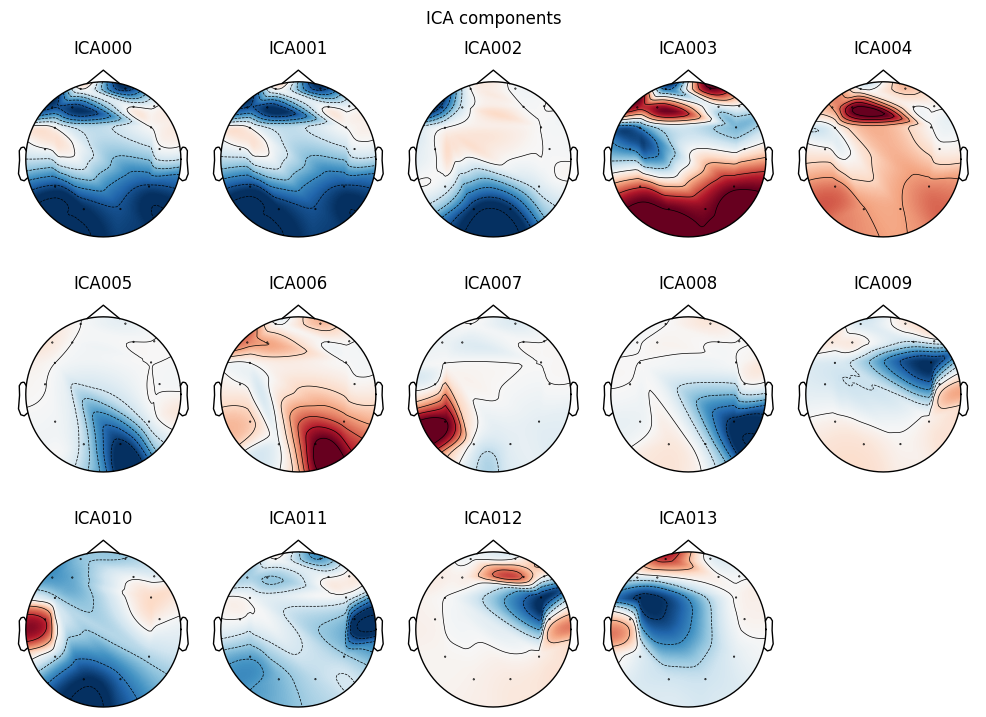

Creating RawArray with float64 data, n_channels=14, n_times=308868
    Range : 0 ... 308867 =      0.000 ...  2413.023 secs
Ready.
Using matplotlib as 2D backend.


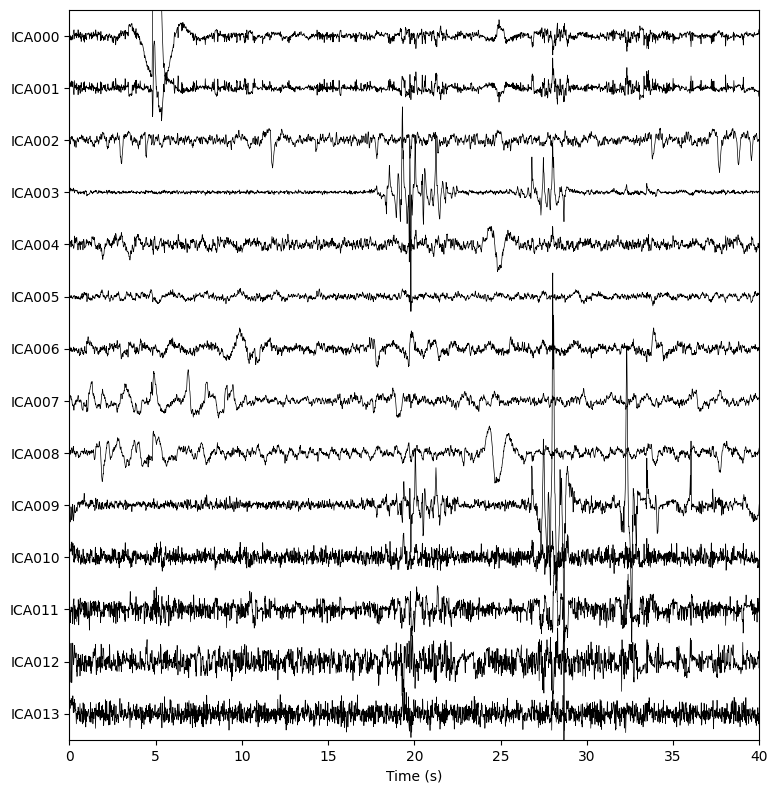

Vẽ các thành phần ICA cho file thứ 2


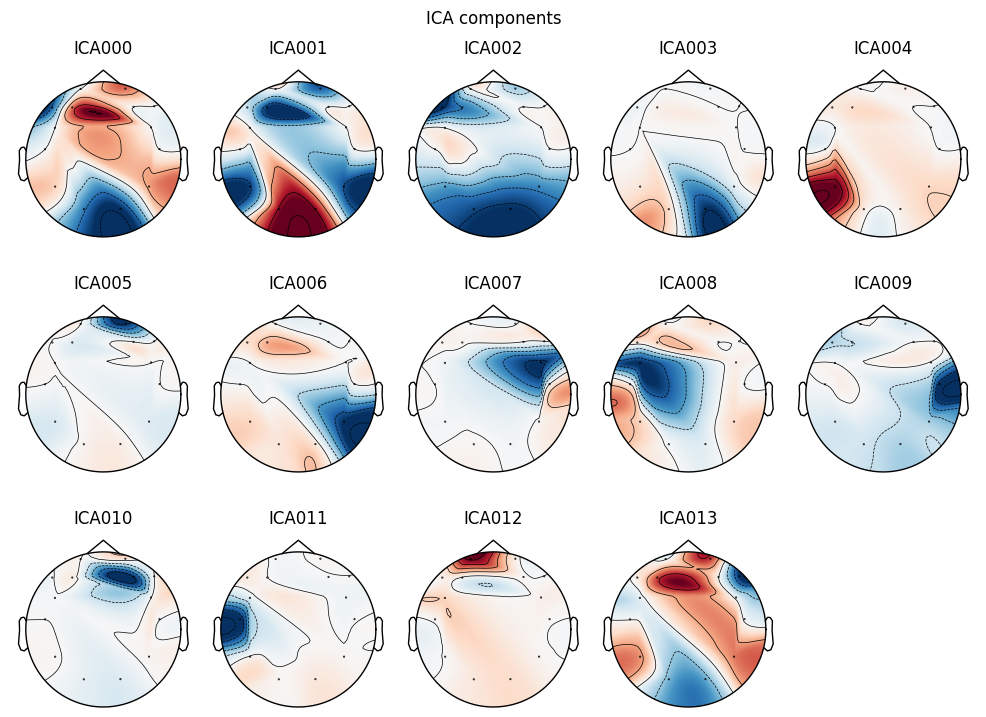

Creating RawArray with float64 data, n_channels=14, n_times=366020
    Range : 0 ... 366019 =      0.000 ...  2859.523 secs
Ready.


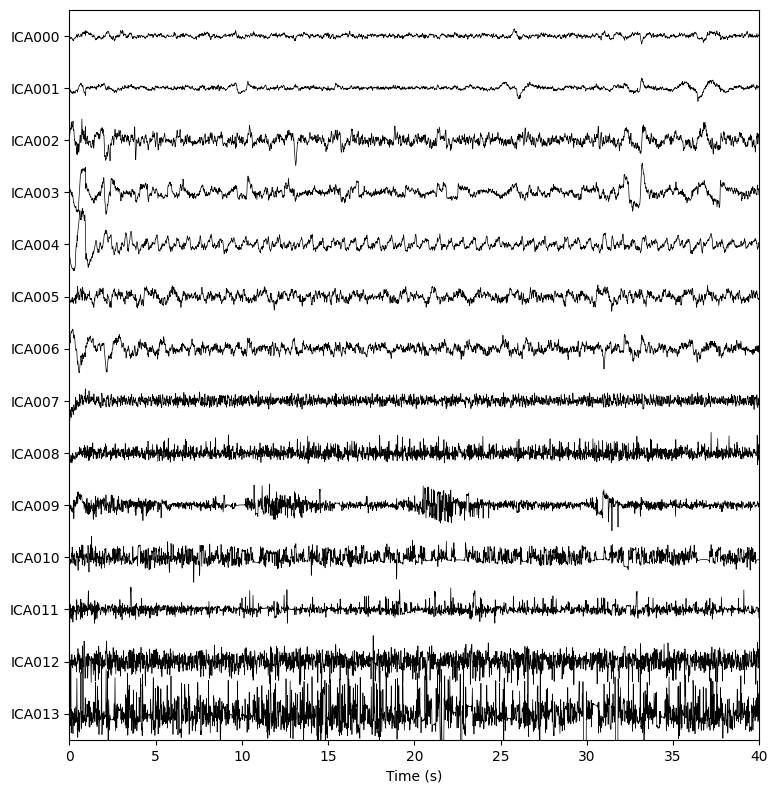

In [ ]:
plot_ica_components(ica_full_data, raw_full_data)

Vẽ các thành phần ICA cho file thứ 3


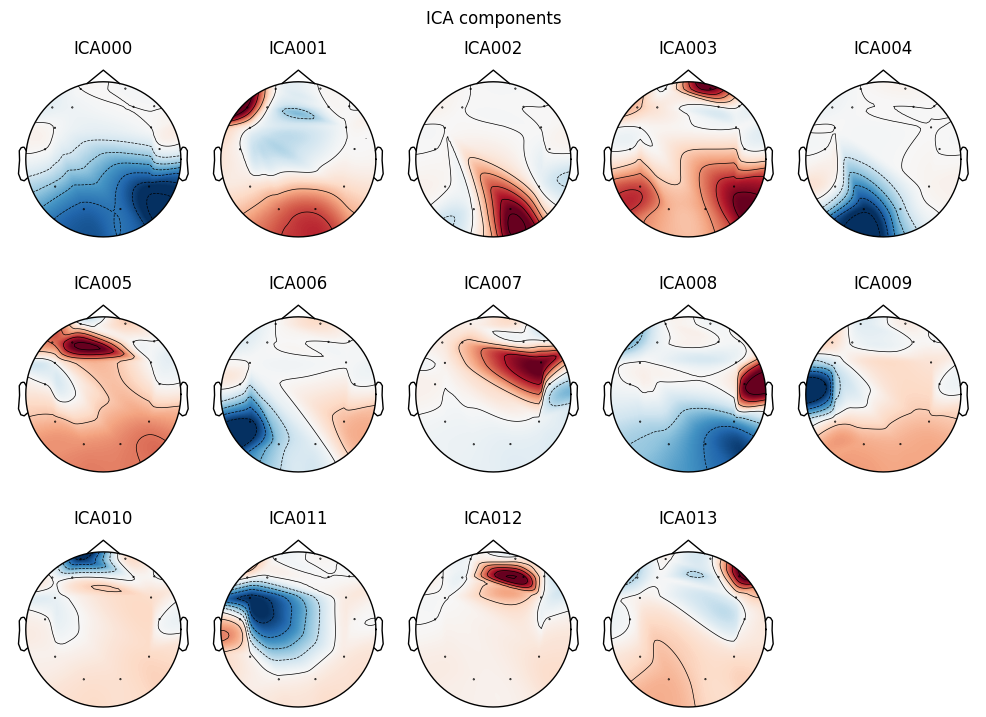

Creating RawArray with float64 data, n_channels=14, n_times=351204
    Range : 0 ... 351203 =      0.000 ...  2743.773 secs
Ready.


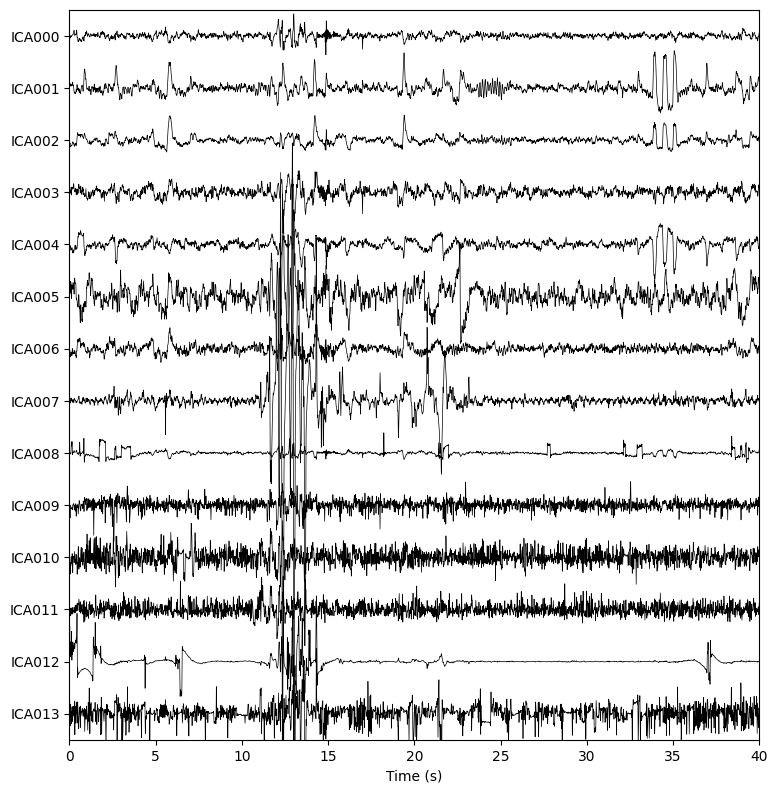

Vẽ các thành phần ICA cho file thứ 10


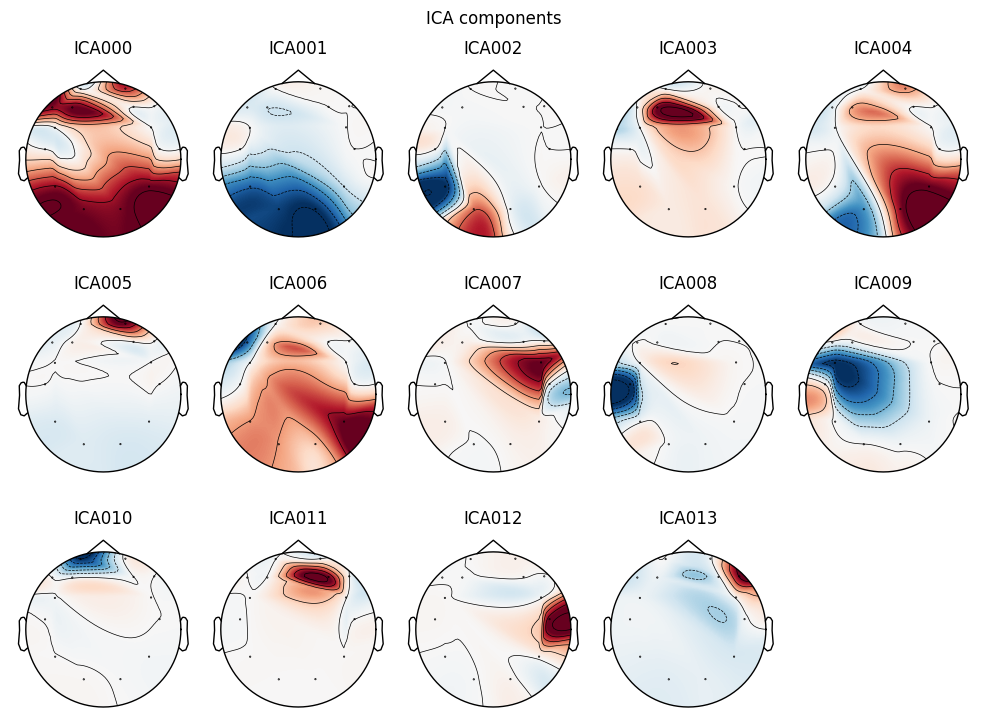

Creating RawArray with float64 data, n_channels=14, n_times=345164
    Range : 0 ... 345163 =      0.000 ...  2696.586 secs
Ready.


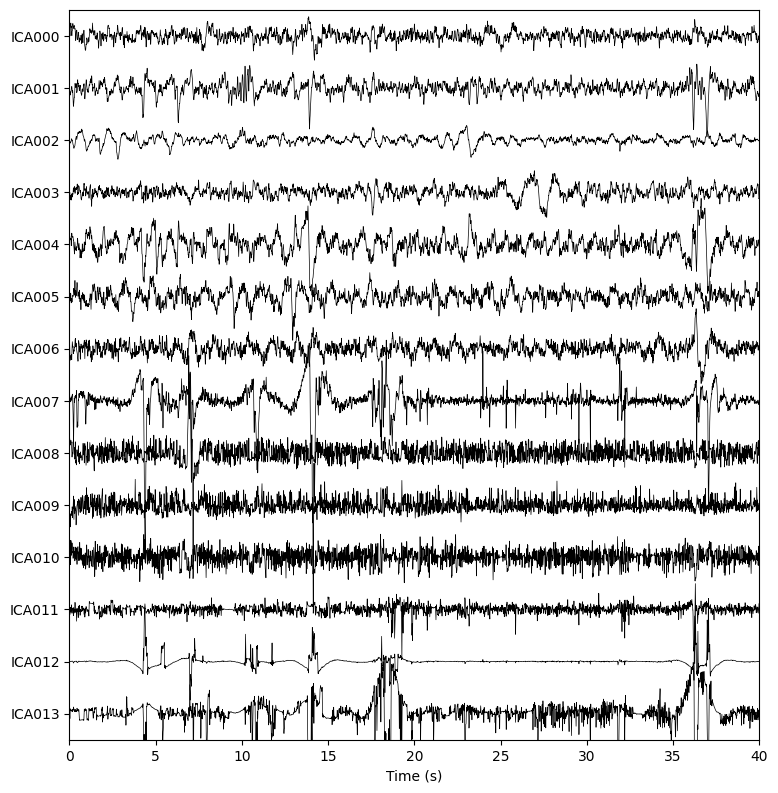

In [ ]:
plot_ica_components(ica_reduce_data, raw_reduce_data, num_files=2, reduce=True)

In [ ]:
def detect_eog_artifacts(ica, raw, eye_channels):
    all_eog_indices = {}

    for ch in eye_channels:
        if ch in raw.ch_names:  # Kiểm tra nếu kênh có tồn tại trong đối tượng Raw
            try:
                # Phát hiện nhiễu nháy mắt (EOG)
                eog_indices, _ = ica.find_bads_eog(raw, ch_name=ch)
                all_eog_indices[ch] = eog_indices
                # print(f"Các thành phần ICA liên quan đến nháy mắt với kênh {ch}: {eog_indices}")
            except Exception as e:
                print(f"Lỗi khi chạy với kênh {ch}: {e}")

    return all_eog_indices

def detect_ecg_artifacts(ica, raw, heart_related_channels):
    all_ecg_indices = {}

    for ch in heart_related_channels:
        if ch in raw.ch_names:  # Kiểm tra nếu kênh có tồn tại trong đối tượng Raw
            try:
                # Phát hiện nhiễu nhịp tim (ECG)
                ecg_indices, _ = ica.find_bads_ecg(raw, ch_name=ch)
                all_ecg_indices[ch] = ecg_indices
                # print(f"Các thành phần ICA liên quan đến nhịp tim với kênh {ch}: {ecg_indices}")
            except Exception as e:
                print(f"Lỗi khi chạy với kênh {ch}: {e}")

    return all_ecg_indices

def print_indices_results(all_eog_indices, all_ecg_indices):
    # In kết quả EOG
    print("\nKết quả từ tất cả các kênh EOG:")
    for ch, indices in all_eog_indices.items():
        print(f"Kênh {ch}: Thành phần ICA {indices}")

    # In kết quả ECG
    print("\nKết quả từ tất cả các kênh ECG:")
    for ch, indices in all_ecg_indices.items():
        print(f"Kênh {ch}: Thành phần ICA {indices}")

In [ ]:
def detect_artifacts(ica_list, raw_list):
    # Danh sách các kênh bị ảnh hưởng nhiễu từ mắt và tim
    eye_channels = ['AF3', 'AF4', 'F7', 'F8', 'F3', 'F4']
    heart_channels = ['FC5', 'FC6']

    eog_indices = []
    ecg_indices = []

    # Duyệt qua từng file trong raw_list và ica_list
    for i in range(len(raw_list)):
        print(f"\nKết quả cho file #{i + 1}:")
        
        # Phát hiện nhiễu EOG và ECG cho từng file
        eog = detect_eog_artifacts(ica_list[i], raw_list[i], eye_channels)
        ecg = detect_ecg_artifacts(ica_list[i], raw_list[i], heart_channels)

        eog_indices.append(eog)
        ecg_indices.append(ecg)


    return eog_indices, ecg_indices

In [ ]:
eog_indices_full, ecg_indices_full = detect_artifacts(ica_full_data, raw_full_data)


Kết quả cho file #1:
Using EOG channel: AF3
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff f

In [ ]:
eog_indices_reduce = get_data_5days(eog_indices_full)
ecg_indices_reduce = get_data_5days(ecg_indices_full)

In [ ]:
def get_artifacts_table(eog_indices, ecg_indices, data_type="EOG"):
    # Khởi tạo danh sách các kênh
    channels = ['AF3', 'AF4', 'F7', 'F8', 'F3', 'F4'] if data_type == "EOG" else ['FC5', 'FC6']

    # Dữ liệu sẽ chứa thông tin từng chỉ số ICA bị nhiễu cho các kênh
    artifact_data = {channel: [] for channel in channels}

    # Duyệt qua từng file để lấy các chỉ số ICA nhiễu
    for artifact in (eog_indices if data_type == "EOG" else ecg_indices):
        for channel in channels:
            # Lấy các thành phần ICA bị nhiễu cho kênh này
            artifact_data[channel].append(artifact.get(channel, []))

    # Chuyển thành DataFrame
    artifact_df = pd.DataFrame(artifact_data)

    # Trả về bảng kết quả
    return artifact_df.transpose()  # Trả về DataFrame với mỗi file là một cột

# In kết quả EOG - Dữ liệu đầy đủ
eog_full_df = get_artifacts_table(eog_indices_full, ecg_indices_full, data_type="EOG")
print("Các chỉ số ICA bị nhiễu mắt (EOG) - Dữ liệu đầy đủ:")
print(eog_full_df)

# In kết quả EOG - Dữ liệu giảm
eog_reduce_df = get_artifacts_table(eog_indices_reduce, ecg_indices_reduce, data_type="EOG")
print("\nCác chỉ số ICA bị nhiễu mắt (EOG) - Dữ liệu giảm:")
print(eog_reduce_df)

# In kết quả ECG - Dữ liệu đầy đủ
ecg_full_df = get_artifacts_table(eog_indices_full, ecg_indices_full, data_type="ECG")
print("\nCác chỉ số ICA bị nhiễu tim (ECG) - Dữ liệu đầy đủ:")
print(ecg_full_df)

# In kết quả ECG - Dữ liệu giảm
ecg_reduce_df = get_artifacts_table(eog_indices_reduce, ecg_indices_reduce, data_type="ECG")
print("\nCác chỉ số ICA bị nhiễu tim (ECG) - Dữ liệu giảm:")
print(ecg_reduce_df)

Các chỉ số ICA bị nhiễu mắt (EOG) - Dữ liệu đầy đủ:
      0     1        2         3        4     5        6         7        8   \
AF3  [3]  [12]  [10, 7]  [12, 10]  [10, 7]    []  [8, 11]  [10, 11]   [7, 6]   
AF4   []    []      [1]    [2, 0]      [3]   [0]   [2, 1]    [3, 5]      [1]   
F7    []    []       []        []      [1]   [6]       []       [4]       []   
F8   [1]  [13]  [12, 7]        []  [13, 7]  [11]  [13, 9]      [12]      [8]   
F3    []    []      [1]       [0]      [5]    []       []        []       []   
F4    []  [10]  [13, 7]      [13]  [12, 7]  [13]     [12]       [9]  [11, 6]   

          9   ...       24       25   26      27       28       29      30  \
AF3      [9]  ...  [9, 12]  [8, 13]   []  [7, 9]   [7, 4]  [9, 12]     [8]   
AF4      [2]  ...   [1, 0]   [4, 2]  [2]  [4, 5]      [2]       []      []   
F7        []  ...       []      [2]   []     [5]       []   [0, 1]  [4, 3]   
F8   [12, 7]  ...      [8]      [7]   []      []  [10, 6]     [13]    [13] 

In [ ]:
def exclude_ica_components_for_all(ica_list, raw_list, eog_indices_list, ecg_indices_list):

    excluded_raw_list = []
    excluded_ica_list = []

    for idx, ica in enumerate(ica_list):
        print(f"\nĐang loại bỏ thành phần ICA cho file #{idx + 1}:")
        
        # Lấy chỉ số EOG và ECG cho từng file
        eog_indices = eog_indices_list[idx]
        ecg_indices = ecg_indices_list[idx]
        
        # Tạo bản sao của raw để giữ dữ liệu gốc và dữ liệu đã loại trừ riêng biệt
        raw_copy = raw_list[idx].copy()

        # Loại bỏ các thành phần ICA cho EOG và ECG
        all_exclude_indices = []
        
        # Thêm các thành phần ICA bị nhiễu EOG và ECG vào danh sách loại trừ
        for eog in eog_indices.values():  # Duyệt qua các chỉ số EOG
            all_exclude_indices.extend(eog)
        
        for ecg in ecg_indices.values():  # Duyệt qua các chỉ số ECG
            all_exclude_indices.extend(ecg)
        
        # Loại bỏ các thành phần ICA trong ica.exclude
        ica.exclude = list(set(all_exclude_indices))  # Loại bỏ trùng lặp
        print(f"Đã loại bỏ các thành phần ICA: {ica.exclude}")
        
        # Áp dụng ICA sau khi loại trừ
        ica.apply(raw_copy)  # Áp dụng loại trừ vào bản sao của raw

        # Thêm dữ liệu đã loại trừ vào danh sách kết quả
        excluded_raw_list.append(raw_copy)
        excluded_ica_list.append(ica)  # Lưu lại đối tượng ICA đã loại trừ

        print(f"Đã loại trừ thành công cho file #{idx + 1}")
    
    return excluded_ica_list ,excluded_raw_list

# Sử dụng với dữ liệu đầy đủ (full_data) và dữ liệu giảm (reduce_data)
excluded_ica_full, excluded_raw_full = exclude_ica_components_for_all(ica_full_data, raw_full_data, eog_indices_full, ecg_indices_full)

# excluded_raw_reduce_data = exclude_ica_components_for_all(ica_reduce_data, raw_reduce_data, eog_indices_reduce, ecg_indices_reduce)
excluded_ica_reduce = get_data_5days(excluded_ica_full)
excluded_raw_reduce = get_data_5days(excluded_raw_full)


Đang loại bỏ thành phần ICA cho file #1:
Đã loại bỏ các thành phần ICA: [1, 3]
Applying ICA to Raw instance


    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components
Đã loại trừ thành công cho file #1

Đang loại bỏ thành phần ICA cho file #2:
Đã loại bỏ các thành phần ICA: [10, 12, 13]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components
Đã loại trừ thành công cho file #2

Đang loại bỏ thành phần ICA cho file #3:
Đã loại bỏ các thành phần ICA: [1, 7, 10, 12, 13]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 5 ICA components
    Projecting back using 14 PCA components
Đã loại trừ thành công cho file #3

Đang loại bỏ thành phần ICA cho file #4:
Đã loại bỏ các thành phần ICA: [0, 2, 10, 12, 13]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 5 ICA components
    Projecting back using 14 PCA components
Đã loại trừ thành công cho file #4

Đang loại 

Vẽ các thành phần ICA cho file thứ 1


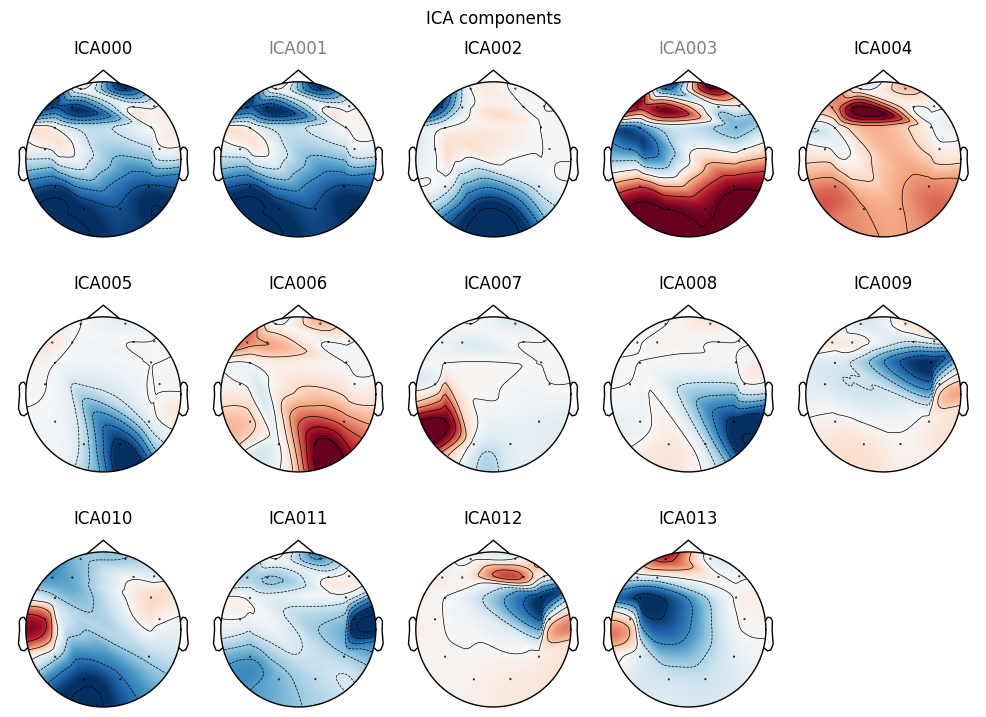

Creating RawArray with float64 data, n_channels=14, n_times=308868
    Range : 0 ... 308867 =      0.000 ...  2413.023 secs
Ready.


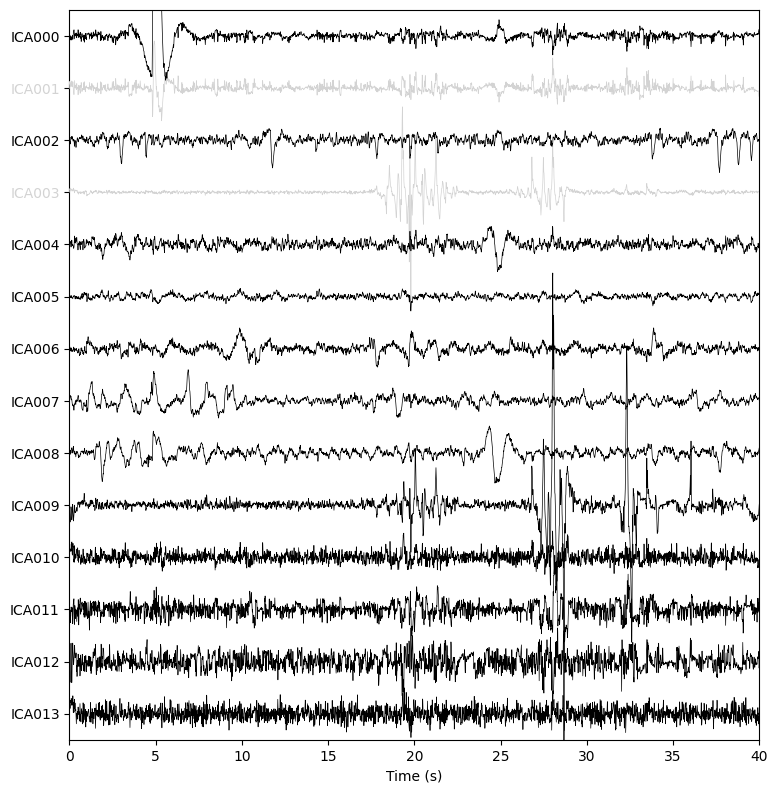

Vẽ các thành phần ICA cho file thứ 2


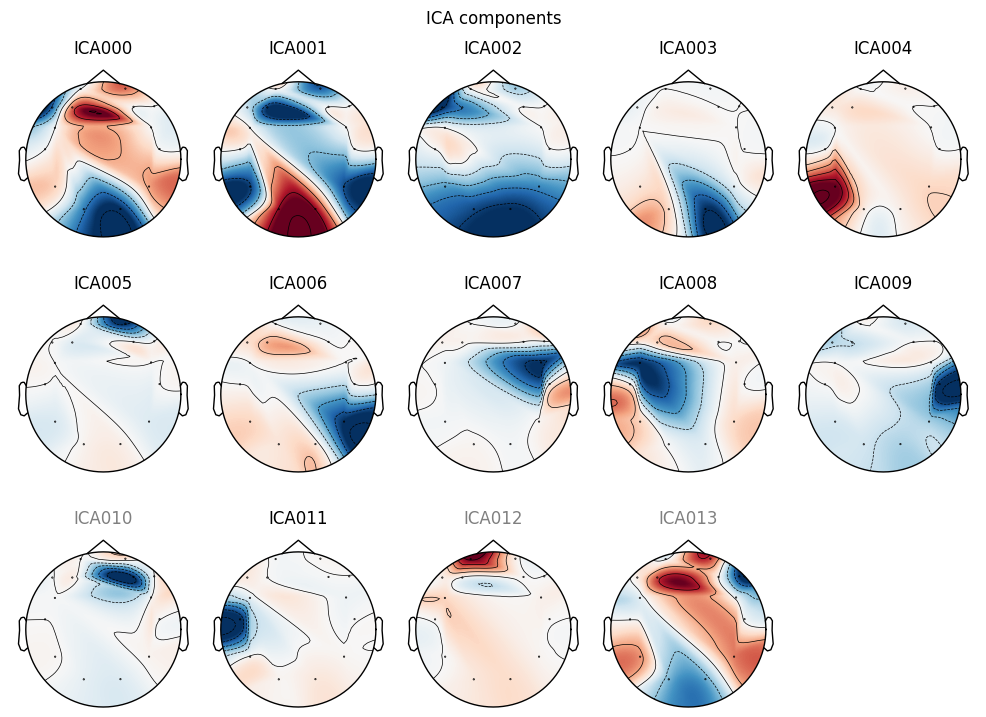

Creating RawArray with float64 data, n_channels=14, n_times=366020
    Range : 0 ... 366019 =      0.000 ...  2859.523 secs
Ready.


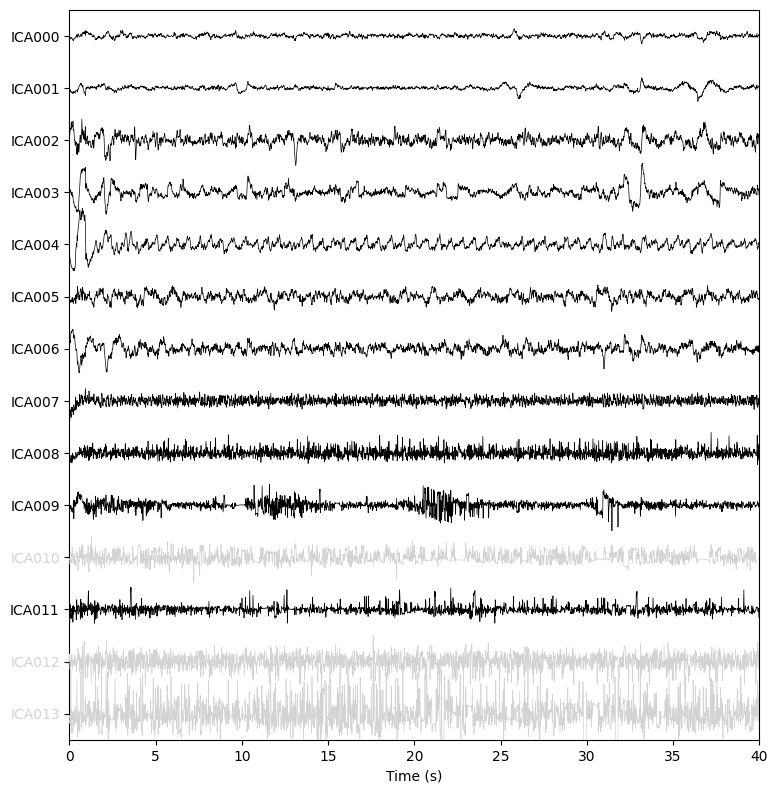

In [ ]:
plot_ica_components(ica_full_data, raw_full_data)

Vẽ các thành phần ICA cho file thứ 1


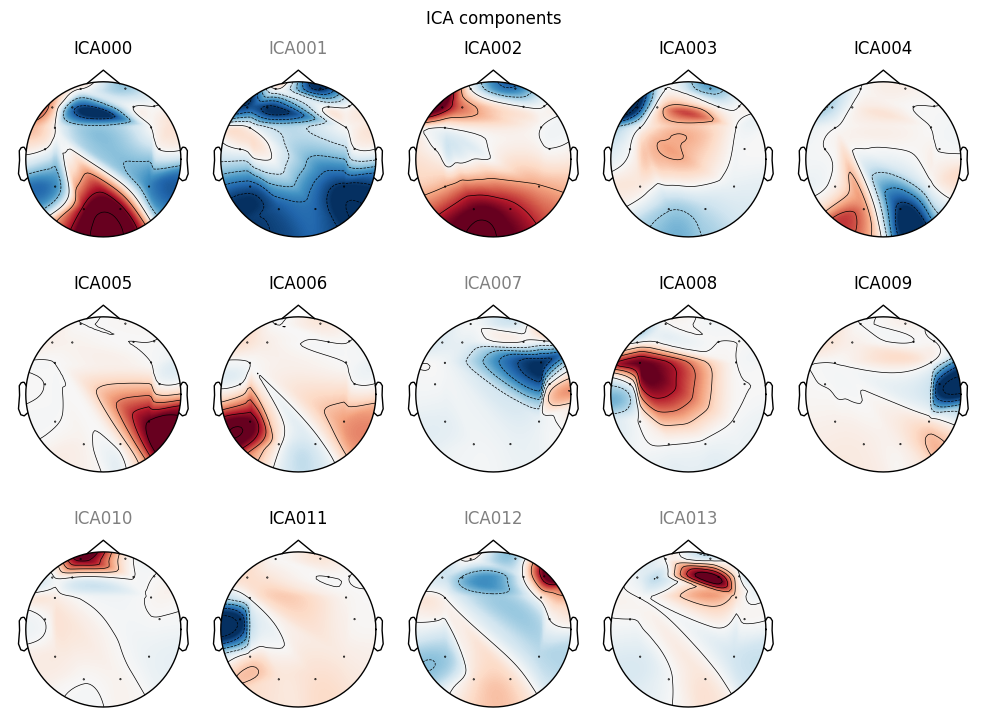

Creating RawArray with float64 data, n_channels=14, n_times=357224
    Range : 0 ... 357223 =      0.000 ...  2790.805 secs
Ready.


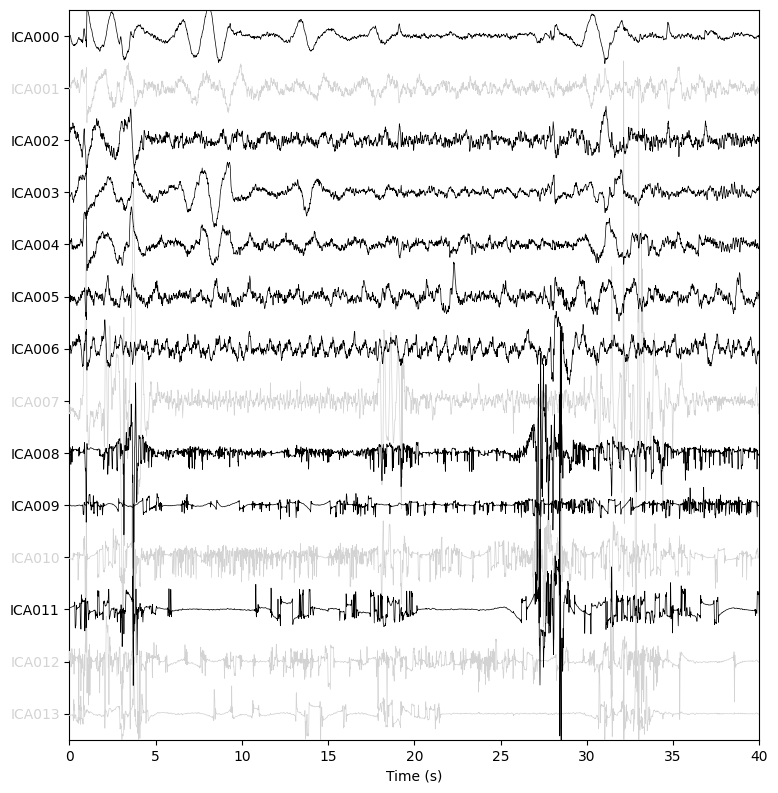

Vẽ các thành phần ICA cho file thứ 2


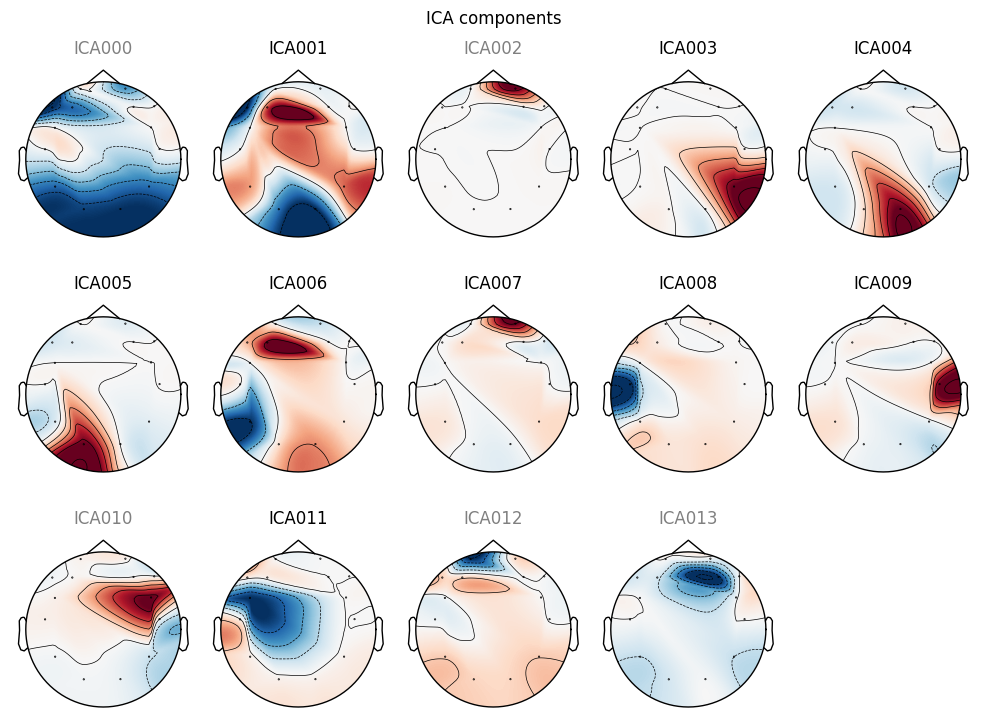

Creating RawArray with float64 data, n_channels=14, n_times=380344
    Range : 0 ... 380343 =      0.000 ...  2971.430 secs
Ready.


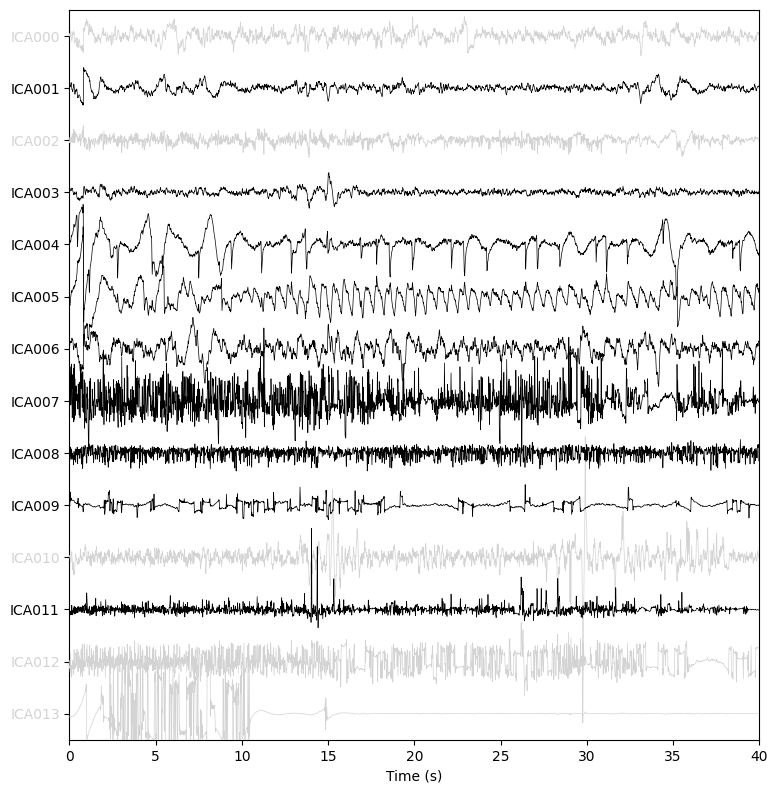

In [ ]:
plot_ica_components(ica_reduce_data, raw_reduce_data)

In [ ]:
# Lưu dữ liệu vào một dictionary với keys là 'file_1', 'file_2', ...
full_data_ICA = {}
reduce_data_ICA = {}

for idx, raw in enumerate(excluded_raw_full):
    file_key = f"file_{idx + 1}"  # Key cho từng file (file_1, file_2, ...)
    full_data_ICA[file_key] = raw.get_data().T  # Lưu dữ liệu của file vào dictionary

for idx, raw in enumerate(excluded_raw_reduce):
    file_key = f"file_{idx + 1}"  # Key cho từng file (file_1, file_2, ...)
    reduce_data_ICA[file_key] = raw.get_data().T  # Lưu dữ liệu của file vào dictionary

In [ ]:
# In thử data của 1 file 
full_data_ICA['file_1']

array([[ 3.88631186e-01,  2.54681193e+00, -5.51185292e-01, ...,
         5.60308676e-01,  2.40529622e-01,  2.01338584e+00],
       [ 1.97927779e+00,  5.78846108e+01,  6.12609134e+01, ...,
         9.05149872e-01,  2.04809179e+00,  6.21884890e+01],
       [ 3.50447792e+00,  7.30159615e+01,  7.77386760e+01, ...,
         1.29703891e+00,  3.19064624e+00,  7.68156540e+01],
       ...,
       [-2.76742229e+00,  7.32630193e+00,  1.28927218e+00, ...,
         1.24127001e+00,  8.12427282e-02,  1.32421128e+00],
       [-1.73737497e+00,  1.02172418e+01,  4.85324104e+00, ...,
         1.30891106e+00,  8.56321229e-03,  5.09085610e+00],
       [-7.29713512e-02, -5.02942161e-01, -3.76490191e+00, ...,
        -2.88761416e-02, -9.41768811e-02, -1.57261765e+00]])

In [35]:
full_data_ICA['file_1'].shape

(308868, 14)

# Extract Features ST FrFT

In [78]:
import numpy as np
import pandas as pd
from scipy.signal import welch
from scipy.integrate import trapz
from scipy.signal import stft
from scipy.fft import fft, ifft, fftshift

# Hàm tính toán power trong các dải tần số
def bandpower(x, sf, band):
    f, Pxx = welch(x, sf, nperseg=sf)  # Đã sửa thành `welch` thay vì `psd_welch`
    idx_band = np.logical_and(f >= band[0], f <= band[1])
    return trapz(Pxx[idx_band], f[idx_band])

# Hàm tính tổng công suất
def total_power(x, sf):
    f, Pxx = welch(x, sf, nperseg=sf)  # Đã sửa thành `welch` thay vì `psd_welch`
    return trapz(Pxx, f)

# Hàm tính tần số trung bình
def median_frequency(x, sf):
    f, Pxx = welch(x, sf, nperseg=sf)  # Đã sửa thành `welch` thay vì `psd_welch`
    cumsum = np.cumsum(Pxx) / np.sum(Pxx)
    return f[np.where(cumsum >= 0.5)[0][0]]

# Hàm tính tần số đỉnh
def peak_frequency(x, sf):
    f, Pxx = welch(x, sf, nperseg=sf)  # Đã sửa thành `welch` thay vì `psd_welch`
    return f[np.argmax(Pxx)]

# Hàm tính Spectral Entropy
def spectral_entropy(x, sf):
    f, Pxx = welch(x, sf, nperseg=sf)  # Đã sửa thành `welch` thay vì `psd_welch`
    Pxx_norm = Pxx / np.sum(Pxx)
    return -np.sum(Pxx_norm * np.log2(Pxx_norm))

# Dải tần số cho từng nhóm
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 12),
    'Beta': (12, 30),
}

In [101]:
def stfrft(data, fs, nperseg, alpha=0.5):
    # Chuyển đổi tín hiệu về miền tần số
    N = len(data)
    f = np.fft.fftfreq(N, d=1/fs)
    f = fftshift(f)  # Đưa tần số về miền dương
    X = fftshift(fft(data))  # Fourier Transform của tín hiệu
    
    # Thực hiện Fractional Fourier Transform với alpha
    theta = np.pi * alpha
    phase = np.exp(-1j * theta * f)
    X_alpha = X * phase
    
    # Tính lại tín hiệu theo STFrFT
    Zxx = ifft(fftshift(X_alpha))
    return f, Zxx.real

# Hàm tính STFrFT cho tín hiệu EEG
def stfrft_transform(data, fs, window_samples, alpha=0.5):
    # alpha là tham số của Fractional Fourier Transform
    f, Zxx = stfrft(data, fs, nperseg=window_samples, alpha=alpha)
    return f, Zxx


def extract_features(data, fs, window_samples):
    num_samples, num_channels = data.shape
    all_features = []  # Danh sách để chứa các đặc trưng cho từng cửa sổ
    
    for start in range(0, num_samples, window_samples):
        end = min(start + window_samples, num_samples)
        window_data = data[start:end, :]
        
        # Trích xuất đặc trưng cho mỗi kênh EEG
        for ch in range(num_channels):
            ch_data = window_data[:, ch]
            
            # Tính các đặc trưng từ STFT
            # Spectral Entropy
            spectral_ent = spectral_entropy(ch_data, fs)
            # Total Power
            total_power_value = total_power(ch_data, fs)  # Đổi tên biến để tránh trùng với tên hàm
            # Median Frequency
            median_freq = median_frequency(ch_data, fs)
            # Peak Frequency
            peak_freq = peak_frequency(ch_data, fs)
            
            # Tính band power cho từng dải tần số
            band_powers = {band: bandpower(ch_data, fs, (low, high)) for band, (low, high) in bands.items()}
            
            # Tạo dictionary lưu các đặc trưng
            feature_row = {
                "Spectral_Entropy": spectral_ent,
                "Total_Power": total_power_value,  # Sử dụng biến đã đổi tên
                "Median_Frequency": median_freq,
                "Peak_Frequency": peak_freq,
                "Delta": band_powers['Delta'],
                "Theta": band_powers['Theta'],
                "Alpha": band_powers['Alpha'],
                "Beta": band_powers['Beta'],
                "window": start // window_samples,  # Chỉ số cửa sổ
                "channel": ch + 1  # Chỉ số kênh (1-based index)
            }
            
            # Thêm dòng vào danh sách
            all_features.append(feature_row)
    
    # Chuyển danh sách các đặc trưng thành DataFrame
    df_features = pd.DataFrame(all_features)
    return df_features


In [ ]:
def apply_STFrFT_and_extract_features(data, window_size, overlap, fs):
    feature_results = []  # Danh sách lưu kết quả trích xuất đặc trưng cho từng cửa sổ

    num_samples, num_channels = data.shape  # Lấy số mẫu và số kênh từ dữ liệu đầu vào
    
    # Kiểm tra phần dư nếu tín hiệu không chia hết cho window_size
    remainder = num_samples % window_size  # Phần dư khi chia số mẫu cho kích thước cửa sổ
    if remainder > 0:
        # Lấy phần tín hiệu còn lại làm cửa sổ cuối cùng
        last_window_signal = data[-remainder:, :]  
        # Trích xuất đặc trưng cho cửa sổ cuối cùng này
        last_window_features = extract_features(last_window_signal, fs, window_size)
        feature_results.append(last_window_features)  # Thêm kết quả vào danh sách
    
    # Lặp qua tất cả các cửa sổ với độ chồng lấn đã chỉ định
    for start in range(0, num_samples - remainder, window_size - overlap):
        end = min(start + window_size, num_samples)  # Xác định điểm kết thúc cửa sổ
        window_signal = data[start:end, :]  # Lấy dữ liệu trong cửa sổ
        
        # Trích xuất đặc trưng cho cửa sổ này
        window_features = extract_features(window_signal, fs, window_size)
        
        # Thêm kết quả đặc trưng của cửa sổ vào danh sách
        feature_results.append(window_features)

    # Chuyển danh sách kết quả thành DataFrame để dễ dàng xử lý và phân tích
    feature_df = pd.DataFrame(feature_results)
    
    # Đảm bảo DataFrame có tên cột rõ ràng (nếu cần thiết)
    feature_df.columns = [f"Feature_{i}" for i in range(feature_df.shape[1])]
    
    return feature_df  # Trả về DataFrame chứa các đặc trưng đã trích xuất

In [106]:
fs = sampFreq  # Frequency sampling (Hz)
window_size = 15 * sampFreq  # 15s * 128Hz
overlap = 0.5 * window_size  # Overlap 50%
a = 0.5  # Fractional order for FrFT

In [110]:
file_1_data = full_data_ICA['file_1']

# Áp dụng STFrFT và trích xuất đặc trưng cho 'file_1'
result_file_1 = apply_STFrFT_and_extract_features(file_1_data, window_size, overlap, fs)

C:\Users\Administra\AppData\Roaming\Python\Python312\site-packages\scipy\signal\_spectral_py.py:600: UserWarning: nperseg = 128 is greater than input length  = 14, using nperseg = 14
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
C:\Users\Administra\AppData\Local\Temp\ipykernel_40744\2334201273.py:17: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  return trapz(Pxx, f)
C:\Users\Administra\AppData\Local\Temp\ipykernel_40744\2334201273.py:12: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  return trapz(Pxx[idx_band], f[idx_band])


KeyboardInterrupt: 

# Features Extract

In [38]:
from scipy.signal import stft
from numpy import blackman
from scipy.stats import entropy

In [39]:
# Hàm tính entropy phổ
def spectral_entropy(psd, freqs):
    psd_norm = psd / np.sum(psd)  # Chuẩn hóa công suất phổ
    psd_norm = np.clip(psd_norm, 1e-10, 1)  # Tránh log(0) bằng cách giới hạn giá trị nhỏ nhất
    return entropy(psd_norm)

# Hàm tính band power
def compute_band_power(psd, freqs, band):
    low, high = band
    band_idx = np.logical_and(freqs >= low, freqs <= high)
    return np.sum(psd[band_idx])  # Trả về tổng công suất trong dải tần

def extract_features(signal, fs, bands):
    # Áp dụng Blackman window
    window = blackman(len(signal))
    signal_windowed = signal * window
    
    # Tính STFT
    freqs, _, Zxx = stft(signal_windowed, fs, nperseg=fs*2)
    psd = np.abs(Zxx)**2
    psd_mean = psd.mean(axis=1)  # Trung bình trên thời gian
    
    # Tính các đặc trưng
    total_power = np.sum(psd_mean)  # Tổng công suất trong tất cả các kênh và toàn bộ thời gian
    spectral_ent = spectral_entropy(psd_mean, freqs)
    
    # Median Frequency
    cumulative_power = np.cumsum(psd_mean)
    median_freq = freqs[np.where(cumulative_power >= 0.5 * total_power)[0][0]]
    
    # Peak Frequency
    peak_freq = freqs[np.argmax(psd_mean)]
    
    # Band power cho từng dải tần
    band_powers = {band: compute_band_power(psd_mean, freqs, band_range) for band, band_range in bands.items()}
    
    # Tạo kết quả đặc trưng
    features = {
        "Spectral_Entropy": spectral_ent,
        "Total_Power": total_power,
        "Median_Frequency": median_freq,
        "Peak_Frequency": peak_freq,
    }
    features.update(band_powers)
    return features

In [67]:
# # Hàm tính đặc trưng cho 1 file
# def extract_one_file(file_key, data, fs, bands, segment_length, window_duration):
#     results = []
#     num_segments = data.shape[0] // segment_length  # Số phân đoạn

#     for segment_idx in range(num_segments):
#         segment = data[segment_idx * segment_length:(segment_idx + 1) * segment_length, :]
        
#         # Xác định thời gian bắt đầu và kết thúc của phân đoạn
#         segment_start_time = segment_idx * window_duration  # Thời gian bắt đầu (giây)
#         segment_end_time = segment_start_time + window_duration  # Thời gian kết thúc (giây)
        
#         # Gắn nhãn dựa trên thời gian
#         if segment_start_time < 600:  # 10 phút đầu -> Focused
#             label = "Focused"
#         elif segment_start_time < 1200:  # 10 phút tiếp theo -> Unfocused
#             label = "Unfocused"
#         else:  # Phần còn lại -> Drowsy
#             label = "Drowsy"
        
#         for ch in range(segment.shape[1]):  # Duyệt qua từng kênh
#             features = extract_features(segment[:, ch], fs, bands)
#             features.update({
#                 "File": file_key,
#                 "Segment": segment_idx,
#                 "Channel": ch,
#                 "Label": label
#             })
#             results.append(features)
    
#     return results

# Hàm tính đặc trưng cho 1 file
def extract_one_file(file_key, data, fs, bands, segment_length, window_duration):
    results = []
    num_segments = data.shape[0] // segment_length  # Số phân đoạn

    # Giới hạn số phân đoạn để chỉ lấy dữ liệu trong 30 phút đầu
    max_segments = 30 * 60 // window_duration  # 30 phút, mỗi phân đoạn có độ dài window_duration
    num_segments = min(num_segments, max_segments)

    # Đảm bảo mỗi nhãn có số lượng phân đoạn bằng nhau (10 phút cho mỗi nhãn)
    segments_per_label = max_segments // 3  # 10 phút mỗi nhãn
    
    for segment_idx in range(num_segments):
        segment = data[segment_idx * segment_length:(segment_idx + 1) * segment_length, :]

        # Xác định thời gian bắt đầu của phân đoạn
        segment_start_time = segment_idx * window_duration  # Thời gian bắt đầu (giây)

        # Gắn nhãn dựa trên thời gian và đảm bảo tính cân bằng
        if segment_idx < segments_per_label:  # 10 phút đầu -> Focused
            label = "Focused"
        elif segment_idx < 2 * segments_per_label:  # 10 phút tiếp theo -> Unfocused
            label = "Unfocused"
        else:  # 10 phút tiếp theo -> Drowsy
            label = "Drowsy"

        for ch in range(segment.shape[1]):  # Duyệt qua từng kênh
            features = extract_features(segment[:, ch], fs, bands)
            features.update({
                "File": file_key,
                "Segment": segment_idx,
                "Channel": ch,
                "Label": label
            })
            results.append(features)

    return results


# Hàm tính đặc trưng cho tất cả các file
def extract_all_files(full_data_ICA, fs, bands, segment_length, window_duration):
    all_results = []
    
    for file_key, data in full_data_ICA.items():
        file_results = extract_one_file(file_key, data, fs, bands, segment_length, window_duration)
        all_results.extend(file_results)
    
    # Chuyển kết quả thành DataFrame
    features_df = pd.DataFrame(all_results)

    # # Lưu ra file CSV
    # features_df.to_csv("EEG_features_full_data.csv", index=False)
    # print("Đặc trưng đã được trích xuất, gắn nhãn và lưu vào file 'EEG_features_full_data.csv'")

    features_df.to_csv("EEG_features_reduce_data_nobalance.csv", index=False)
    print("Đặc trưng đã được trích xuất, gắn nhãn và lưu vào file 'EEG_features_reduce_data_nobalance.csv'")

    return features_df

In [68]:
# Định nghĩa các dải tần
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 13),
    'Beta': (13, 30)
}

# Tần số lấy mẫu (sampFreq)
fs = 128  # Hz
window_duration = 15  # Giây
segment_length = fs * window_duration  # Số mẫu mỗi phân đoạn

In [69]:
results_reduce = extract_all_files(reduce_data_ICA, fs, bands, segment_length, window_duration)

Đặc trưng đã được trích xuất, gắn nhãn và lưu vào file 'EEG_features_reduce_data_nobalance.csv'


# Model FULL DATA

In [110]:
import pandas as pd

# Đọc file CSV
file_path = "EEG_features_labels.csv" 
results = pd.read_csv(file_path)

In [111]:
label_counts = results["Label"].value_counts()
print("Phân phối số lượng mẫu theo trạng thái:")
print(label_counts)

Phân phối số lượng mẫu theo trạng thái:
Label
Drowsy       52934
Focused      19040
Unfocused    19040
Name: count, dtype: int64


In [112]:
features = results.drop(columns=["File", "Segment", "Channel"])

In [113]:
features.describe()

,Spectral_Entropy,Total_Power,Median_Frequency,Peak_Frequency,Delta,Theta,Alpha,Beta
count,91014.000000,9.101400e+04,91014.000000,91014.000000,9.101400e+04,9.101400e+04,9.101400e+04,9.101400e+04
mean,3.351185,4.362403e+01,6.121388,3.256087,3.529103e+01,2.584461e+00,1.794952e+00,1.214846e+00
std,0.627961,1.095186e+03,4.407184,4.629734,9.627421e+02,7.897074e+01,1.708861e+01,1.322363e+01
min,0.897956,2.656986e-07,0.500000,0.500000,8.061236e-08,3.637967e-08,3.428249e-08,6.422276e-08
25%,3.036620,4.336433e-02,2.000000,1.000000,1.553863e-02,7.002024e-03,6.872071e-03,9.910041e-03
50%,3.431335,7.898331e-01,5.000000,1.000000,2.393922e-01,1.331883e-01,1.411335e-01,2.208969e-01
75%,3.911583,9.998586e+00,10.000000,3.000000,4.799681e+00,1.372172e+00,1.243883e+00,9.820377e-01
max,4.153035,1.784379e+05,25.500000,28.000000,1.556668e+05,1.697046e+04,2.594788e+03,1.600647e+03


In [115]:
features.shape

(91014, 9)

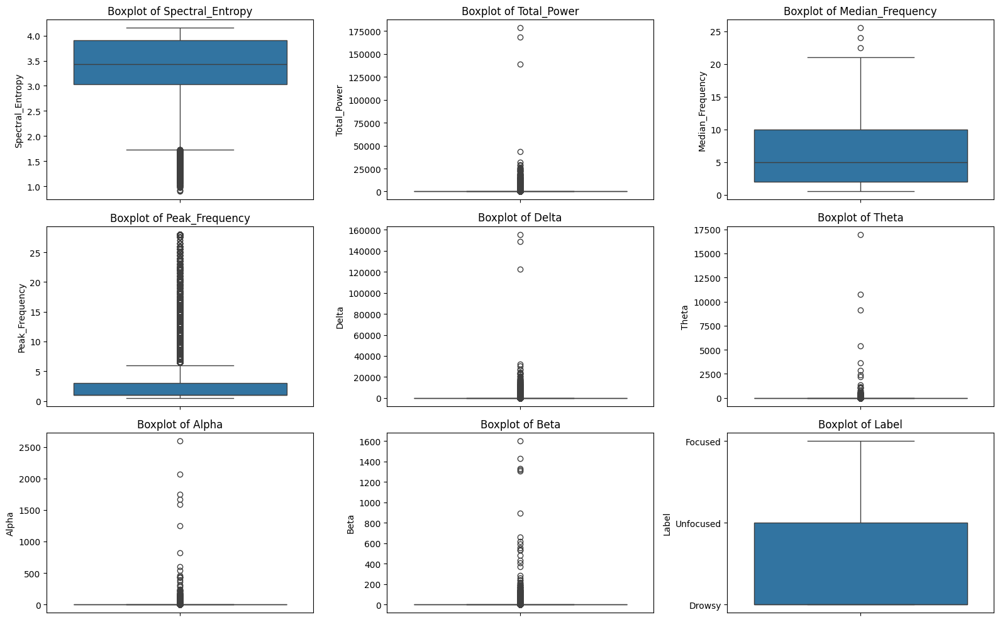

In [116]:
import seaborn as sns

# Vẽ Boxplot cho từng cột
plt.figure(figsize=(16, 10))
for i, col in enumerate(features.columns):
    plt.subplot(3, 3, i+1)  # Tạo các subplot
    sns.boxplot(y=features[col])
    plt.title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()


In [117]:
features = features.drop(features[features['Total_Power'] >= 25000].index)
features = features.drop(features[features['Median_Frequency'] >= 20].index)
features = features.drop(features[features['Peak_Frequency'] >= 20].index)
features = features.drop(features[features['Delta'] >= 20000].index)
features = features.drop(features[features['Theta'] >= 2500].index)
features = features.drop(features[features['Alpha'] >= 500].index)
features = features.drop(features[features['Beta'] >= 400].index)

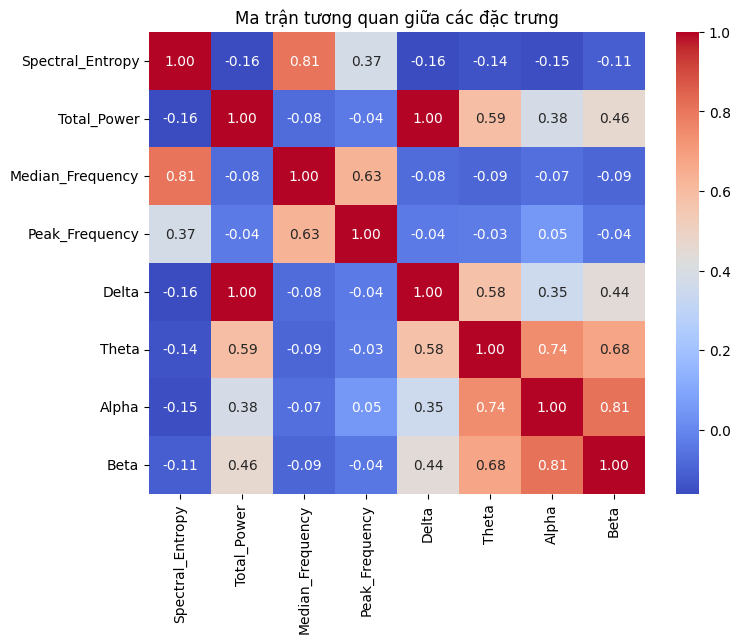

In [118]:
# Tính ma trận tương quan
correlation = features.iloc[:,:8].corr()

# Vẽ heatmap cho ma trận tương quan
plt.figure(figsize=(8, 6))
sns.heatmap(correlation, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Ma trận tương quan giữa các đặc trưng")
plt.show()

In [119]:
new_features = features.drop(columns=['Total_Power'])
new_features.head()

,Spectral_Entropy,Median_Frequency,Peak_Frequency,Delta,Theta,Alpha,Beta,Label
0,4.007544,11.5,1.0,0.064671,0.053725,0.067704,0.133391,Focused
1,1.648620,1.0,1.0,9598.170504,348.687697,110.105639,66.720472,Focused
2,1.656225,1.0,1.0,11410.450708,415.691951,136.495188,86.431096,Focused
3,3.956932,10.0,1.0,0.109968,0.113990,0.103489,0.201545,Focused
4,2.125697,1.0,0.5,3.253998,0.237237,0.150552,0.177906,Focused


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

new_features = features.drop(columns=['Total_Power', 'Label'])

# Tạo nhãn nhị phân cho Drowsy và Undrowsy
labels = features['Label'].apply(lambda x: "Drowsy" if x == "Drowsy" else "Undrowsy")

# Chia dữ liệu thành tập train, val và test
X_train, X_temp, y_train, y_temp = train_test_split(
    new_features, labels, test_size=0.8, random_state=42, stratify=labels
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)

# Scale dữ liệu
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit-transform trên tập train
X_val_scaled = scaler.transform(X_val)          # Transform trên tập val
X_test_scaled = scaler.transform(X_test)        # Transform trên tập test


In [128]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Huấn luyện SVM Drowsy vs Not-Drowsy
svm_binary = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
svm_binary.fit(X_train_scaled, y_train)

# Dự đoán trên tập val
y_val_pred_binary = svm_binary.predict(X_val_scaled)
print("\nĐánh giá trên tập val (Drowsy vs Not-Drowsy):")
print(classification_report(y_val, y_val_pred_binary))

# Dự đoán trên tập test
y_test_pred_binary = svm_binary.predict(X_test_scaled)
print("\nĐánh giá trên tập test (Drowsy vs Not-Drowsy):")
print(classification_report(y_test, y_test_pred_binary))


Đánh giá trên tập val (Drowsy vs Not-Drowsy):
              precision    recall  f1-score   support

      Drowsy       0.60      0.96      0.74      7794
    Undrowsy       0.66      0.10      0.17      5619

    accuracy                           0.60     13413
   macro avg       0.63      0.53      0.45     13413
weighted avg       0.62      0.60      0.50     13413


Đánh giá trên tập test (Drowsy vs Not-Drowsy):
              precision    recall  f1-score   support

      Drowsy       0.60      0.96      0.74      7794
    Undrowsy       0.65      0.10      0.17      5620

    accuracy                           0.60     13414
   macro avg       0.62      0.53      0.45     13414
weighted avg       0.62      0.60      0.50     13414



# Model reduce data

In [70]:
import pandas as pd

# Đọc file CSV
file_path_1 = "EEG_features_reduce_data_nobalance.csv" 
results_1 = pd.read_csv(file_path_1)

In [72]:
label_counts_1 = results_1["Label"].value_counts()
print("Phân phối số lượng mẫu theo trạng thái:")
print(label_counts_1)

Phân phối số lượng mẫu theo trạng thái:
Label
Focused      13440
Unfocused    13440
Drowsy       13314
Name: count, dtype: int64


In [73]:
features_1 = results_1.drop(columns=["File", "Segment", "Channel"])

In [74]:
features_1.describe()

,Spectral_Entropy,Total_Power,Median_Frequency,Peak_Frequency,Delta,Theta,Alpha,Beta
count,40194.000000,4.019400e+04,40194.000000,40194.000000,4.019400e+04,4.019400e+04,4.019400e+04,4.019400e+04
mean,3.330478,3.096383e+01,5.910621,3.044596,2.500438e+01,2.451636e+00,1.438479e+00,8.913205e-01
std,0.641638,1.448524e+03,4.456824,4.531913,1.270423e+03,1.136254e+02,2.207770e+01,1.552457e+01
min,0.931915,3.350472e-07,0.500000,0.500000,9.559041e-08,5.298890e-08,4.512963e-08,7.268306e-08
25%,2.988684,3.252792e-02,2.000000,1.000000,1.190579e-02,5.201696e-03,5.421527e-03,8.001550e-03
50%,3.417234,7.544318e-01,4.500000,1.000000,2.351907e-01,1.248834e-01,1.353880e-01,2.219817e-01
75%,3.908107,9.799075e+00,10.000000,2.500000,4.961394e+00,1.243263e+00,1.105472e+00,9.071875e-01
max,4.153035,1.784379e+05,25.500000,28.000000,1.556668e+05,1.697046e+04,2.594788e+03,1.600647e+03


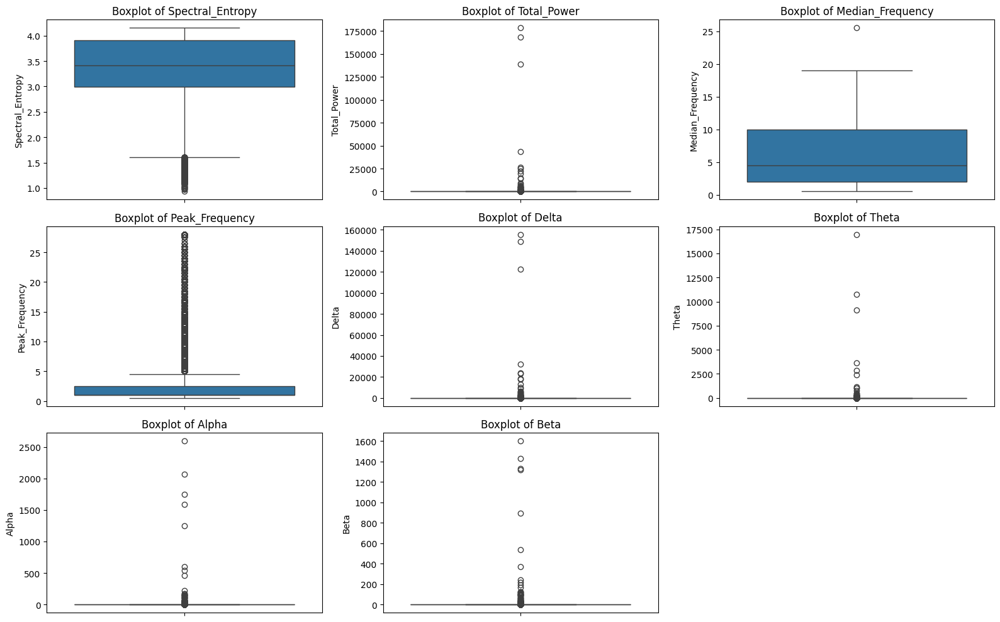

In [75]:
import seaborn as sns

# Vẽ Boxplot cho từng cột
plt.figure(figsize=(16, 10))
for i, col in enumerate(features_1.iloc[:,:8].columns):
    plt.subplot(3, 3, i+1)  # Tạo các subplot
    sns.boxplot(y=features_1[col])
    plt.title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()


In [76]:
features_1 = features_1.drop(features_1[features_1['Total_Power'] >= 25000].index)
features_1 = features_1.drop(features_1[features_1['Median_Frequency'] >= 20].index)
features_1 = features_1.drop(features_1[features_1['Peak_Frequency'] >= 25].index)
features_1 = features_1.drop(features_1[features_1['Delta'] >= 10000].index)
features_1 = features_1.drop(features_1[features_1['Theta'] >= 2500].index)
features_1 = features_1.drop(features_1[features_1['Alpha'] >= 500].index)
features_1 = features_1.drop(features_1[features_1['Beta'] >= 400].index)

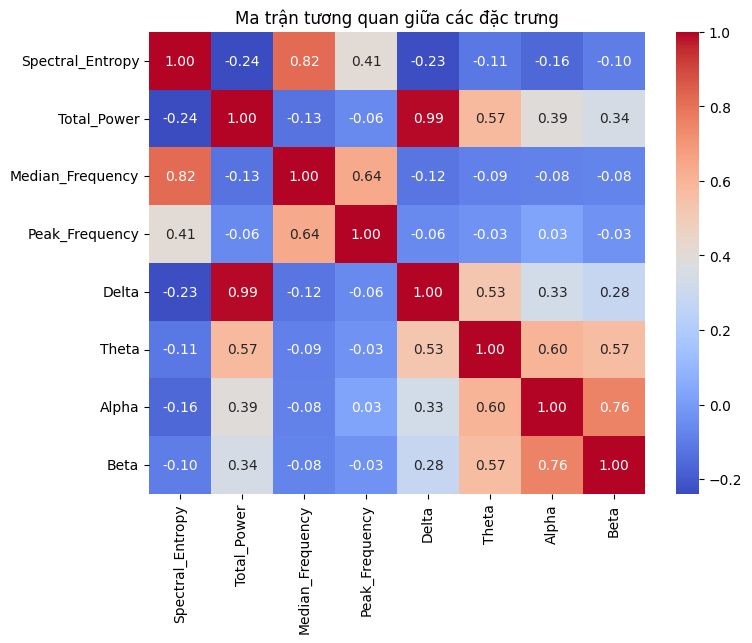

In [77]:
# Tính ma trận tương quan
correlation_1 = features_1.iloc[:,:8].corr()

# Vẽ heatmap cho ma trận tương quan
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_1, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Ma trận tương quan giữa các đặc trưng")
plt.show()

In [86]:
features_1 = features_1.drop(columns=['Total_Power'])

# 3 SVM

In [124]:
from sklearn.model_selection import train_test_split

# Chia dữ liệu cho Drowsy vs Not-Drowsy
labels_drowsy = features_1["Label"].apply(lambda x: "Drowsy" if x == "Drowsy" else "Not-Drowsy")
X_train_drowsy, X_test_drowsy, y_train_drowsy, y_test_drowsy = train_test_split(
    features_1.drop(columns=["Label"]), labels_drowsy, test_size=0.2, random_state=42, stratify=labels_drowsy
)

# Chia dữ liệu cho Focused vs Not-Focused
labels_focused = features_1["Label"].apply(lambda x: "Focused" if x == "Focused" else "Not-Focused")
X_train_focused, X_test_focused, y_train_focused, y_test_focused = train_test_split(
    features_1.drop(columns=["Label"]), labels_focused, test_size=0.2, random_state=42, stratify=labels_focused
)

# Chia dữ liệu cho Unfocused vs Not-Unfocused
labels_unfocused = features_1["Label"].apply(lambda x: "Unfocused" if x == "Unfocused" else "Not-Unfocused")
X_train_unfocused, X_test_unfocused, y_train_unfocused, y_test_unfocused = train_test_split(
    features_1.drop(columns=["Label"]), labels_unfocused, test_size=0.2, random_state=42, stratify=labels_unfocused
)

In [125]:
# Scale dữ liệu Drowsy
scaler_drowsy = StandardScaler()
X_train_drowsy_scaled = scaler_drowsy.fit_transform(X_train_drowsy)
X_test_drowsy_scaled = scaler_drowsy.transform(X_test_drowsy)

# Scale dữ liệu Focused
scaler_focused = StandardScaler()
X_train_focused_scaled = scaler_focused.fit_transform(X_train_focused)
X_test_focused_scaled = scaler_focused.transform(X_test_focused)

# Scale dữ liệu unFocused
scaler_unfocused = StandardScaler()
X_train_unfocused_scaled = scaler_unfocused.fit_transform(X_train_focused)
X_test_unfocused_scaled = scaler_unfocused.transform(X_test_focused)

In [126]:
from sklearn.svm import SVC

# Huấn luyện SVM Drowsy vs Not-Drowsy
svm_drowsy = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
svm_drowsy.fit(X_train_drowsy_scaled, y_train_drowsy)

# Huấn luyện SVM Focused vs Not-Focused
svm_focused = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
svm_focused.fit(X_train_focused_scaled, y_train_focused)

# Huấn luyện SVM Unfocused vs Not-Unfocused
svm_unfocused = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
svm_unfocused.fit(X_train_unfocused_scaled, y_train_unfocused)


SVC(random_state=42)

In [127]:
# Dự đoán với từng mô hình SVM trên tập kiểm tra chung
y_pred_drowsy = svm_drowsy.predict(X_test_drowsy_scaled)
y_pred_focused = svm_focused.predict(X_test_focused_scaled)
y_pred_unfocused = svm_unfocused.predict(X_test_unfocused_scaled)

# Áp dụng XOR-Aggregation để kết hợp kết quả
y_final_pred = []

for p_drowsy, p_focused, p_unfocused in zip(y_pred_drowsy, y_pred_focused, y_pred_unfocused):
    if p_drowsy == "Drowsy" and p_focused == "Not-Focused" and p_unfocused == "Not-Unfocused":
        y_final_pred.append("Drowsy")
    elif p_drowsy == "Not-Drowsy" and p_focused == "Focused" and p_unfocused == "Not-Unfocused":
        y_final_pred.append("Focused")
    elif p_drowsy == "Not-Drowsy" and p_focused == "Not-Focused" and p_unfocused == "Unfocused":
        y_final_pred.append("Unfocused")
    else:
        y_final_pred.append("Unclassified")


In [128]:
# In kết quả
print("Báo cáo kết quả phân loại:")
print(classification_report(y_test_drowsy, y_final_pred))  # Bạn có thể chọn tập y_test tương ứng để so sánh


Báo cáo kết quả phân loại:
              precision    recall  f1-score   support

      Drowsy       0.65      0.10      0.17      2645
     Focused       0.00      0.00      0.00         0
  Not-Drowsy       0.00      0.00      0.00      5345
Unclassified       0.00      0.00      0.00         0
   Unfocused       0.00      0.00      0.00         0

    accuracy                           0.03      7990
   macro avg       0.13      0.02      0.03      7990
weighted avg       0.21      0.03      0.06      7990



C:\Users\Administra\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Administra\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Administra\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitali

# SVM

In [108]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

new_features_1 = features_1.drop(columns=['Label'])

# Tạo nhãn nhị phân cho Drowsy và Undrowsy
labels_1 = features_1['Label']

# label_encoder = LabelEncoder()
# labels_1_encoded = label_encoder.fit_transform(labels_1)

# Chia dữ liệu thành tập train, val và test
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(
    new_features_1, labels_1, test_size=0.2, random_state=42, stratify=labels_1
)

# X_val_1, X_test_1, y_val_1, y_test_1 = train_test_split(
#     X_temp_1, y_temp_1, test_size=0.5, random_state=42, stratify=y_temp_1
# )

# Scale dữ liệu
scaler_1 = StandardScaler()
X_train_scaled_1 = scaler_1.fit_transform(X_train_1)  # Fit-transform trên tập train
# X_val_scaled_1 = scaler_1.transform(X_val_1)          # Transform trên tập val
X_test_scaled_1 = scaler_1.transform(X_test_1)        # Transform trên tập test


In [113]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Huấn luyện SVM Drowsy vs Not-Drowsy
svm_binary_1 = SVC(kernel="rbf", C=1.0, gamma="scale", random_state=42)
svm_binary_1.fit(X_train_scaled_1, y_train_1)

SVC(random_state=42)

In [110]:
# # Dự đoán trên tập val
# y_val_pred_binary_1 = svm_binary_1.predict(X_val_scaled_1)
# print("\nĐánh giá trên tập val (Drowsy vs Not-Drowsy):")
# print(classification_report(y_val_1, y_val_pred_binary_1))

# Dự đoán trên tập test
y_test_pred_binary_1 = svm_binary_1.predict(X_test_scaled_1)

In [111]:
print("\nĐánh giá trên tập test:")
print(classification_report(y_test_1, y_test_pred_binary_1))


Đánh giá trên tập test:
              precision    recall  f1-score   support

      Drowsy       0.50      0.36      0.42      2645
     Focused       0.43      0.61      0.50      2669
   Unfocused       0.37      0.32      0.34      2676

    accuracy                           0.43      7990
   macro avg       0.43      0.43      0.42      7990
weighted avg       0.43      0.43      0.42      7990

